In [ ]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
import folium
from folium.plugins import HeatMap

import os
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

# Mount Google Drive so that Colab can access your cloud storage
drive.mount('/content/drive')

# Set Seaborn plot style to "whitegrid" (white background with grid lines)
sns.set(style="whitegrid")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Folder path where CSV files are stored
file_path = "/content/drive/MyDrive/models/2022"
# file_path_2023 = "/content/drive/MyDrive/models/2023"
# file_path_2024 = "/content/drive/MyDrive/models/2024"

# Read all CSV files in the folder
all_data = pd.DataFrame()

for filename in os.listdir(file_path):
    if filename.endswith(".csv"):
        # Build the full file path
        file_full_path = os.path.join(file_path, filename)

        # Read the CSV file
        df = pd.read_csv(file_full_path)

        # Ensure the 'created' column is in datetime format
        df['created'] = pd.to_datetime(df['created'])

        # Append to the combined DataFrame
        all_data = pd.concat([all_data, df], ignore_index=True)

# Inspect the data
print(all_data.head())

# 2. Extract time-based features
all_data['year'] = all_data['created'].dt.year
all_data['month'] = all_data['created'].dt.month
all_data['day'] = all_data['created'].dt.day
all_data['hour'] = all_data['created'].dt.hour
all_data['date'] = all_data['created'].dt.date

# Preview the data after extracting time features
print("提取时间特征后的 all_data 预览：")
print(all_data.head())

          id             created         received_utc    received_adjusted  \
0  120496144 2021-12-31 19:00:08  2022-01-01 00:00:00  2022-01-01 08:00:00   
1  120496145 2021-12-31 19:00:08  2022-01-01 00:00:02  2022-01-01 09:00:02   
2  120496146 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
3  120496147 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
4  120496148 2021-12-31 19:00:08  2022-01-01 00:00:05  2022-01-01 01:00:05   

   sqmle_serial_number    nsb  sensor_frequency  sensor_period_count  \
0                 4887   0.00          530698.0                  0.0   
1                 3575   0.00          567051.0                  0.0   
2                 5414  14.98              98.0               4687.0   
3                 5347  15.26              74.0               6154.0   
4                 2924  21.33               1.0            1843899.0   

   sensor_period_second  temperature device_code  
0                 0.000         29.6          S

In [ ]:
# Install chardet library for encoding detection (if needed)
!pip install chardet

# Check if 'hour' column exists
if 'hour' not in all_data.columns:
    raise ValueError("The 'hour' column does not exist. Please check the time feature extraction step.")

# Check if there are any missing values in the 'hour' column
if all_data['hour'].isnull().any():
    print("Warning: There are missing values in the 'hour' column!")
    # Drop rows with missing values in 'hour'
    all_data = all_data.dropna(subset=['hour'])

# 2. Load location.csv and map_rel.csv files
location_data = pd.read_csv("/content/drive/MyDrive/location.csv", encoding='gbk', dtype={'latitude': str, 'longitude': str})

# Remove extra commas from latitude and longitude columns and convert to float
location_data['latitude'] = location_data['latitude'].str.replace(',', '').astype(float)
location_data['longitude'] = location_data['longitude'].str.replace(',', '').astype(float)

# Inspect loaded location data
print("Preview of loaded location_data:")
print(location_data.head())

# Load map_rel.csv file
map_rel_data = pd.read_csv("/content/drive/MyDrive/map_rel.csv", encoding='gbk')

# Inspect loaded map_rel data
print("Preview of loaded map_rel_data:")
print(map_rel_data.head())

# 3. Extract unique device_code list
valid_device_codes = map_rel_data['device_code'].unique()

# Print valid device codes
print("List of valid device_codes:")
print(valid_device_codes)

# 4. Filter all_data to keep only valid device_code entries
filtered_all_data = all_data[all_data['device_code'].isin(valid_device_codes)]

# Inspect filtered data
print("Preview of filtered all_data:")
print(filtered_all_data.head())

# 5. Merge location_data with map_rel_data
location_map_data = pd.merge(location_data, map_rel_data, on='location', how='left')

# Inspect merged data
print("Preview of merged location_map_data:")
print(location_map_data.head())

# 6. Join filtered_all_data with location_map_data using device_code
all_data_with_location = pd.merge(filtered_all_data, location_map_data, on='device_code', how='left')

# Inspect final merged data
print("Preview of final merged all_data_with_location:")
print(all_data_with_location.head())

# Check if 'hour' column is present in the final merged data
if 'hour' not in all_data_with_location.columns:
    raise ValueError("The 'hour' column is missing in the merged data!")

加载后的 location_data 预览：
                                            location   latitude   longitude  \
0                        The University of Hong Kong  22.283168  114.136720   
1   Ho Koon Nature Education cum Astronomical Centre  22.383779  114.108089   
2                             Hong Kong Space Museum  22.294445  114.171915   
3       Hong Kong Space Museum Sai Kung iObservatory  22.376577  114.336049   
4  King's Park Meteorological Station, Hong Kong ...  22.311744  114.172859   

   Unnamed: 3  Unnamed: 4  
0         NaN         NaN  
1         NaN         NaN  
2         NaN         NaN  
3         NaN         NaN  
4         NaN         NaN  
加载后的 map_rel_data 预览：
                                            location device_code
0                        The University of Hong Kong         HKU
1   Ho Koon Nature Education cum Astronomical Centre         HKn
2                             Hong Kong Space Museum         TST
3       Hong Kong Space Museum Sai Kung iObservatory

# 1. 绘制 12 个月的光强变化图

按观测点和月份分组后的数据预览：
                                            location  month       nsb
0  Cape D'Aguilar Radiation Monitoring Station, H...      1  9.895955
1  Cape D'Aguilar Radiation Monitoring Station, H...      2  9.625187
2  Cape D'Aguilar Radiation Monitoring Station, H...      3  9.125182
3  Cape D'Aguilar Radiation Monitoring Station, H...      4  8.672999
4  Cape D'Aguilar Radiation Monitoring Station, H...      5  8.358842
数据已保存到 /content/drive/MyDrive/monthly_avg_nsb_by_location.csv


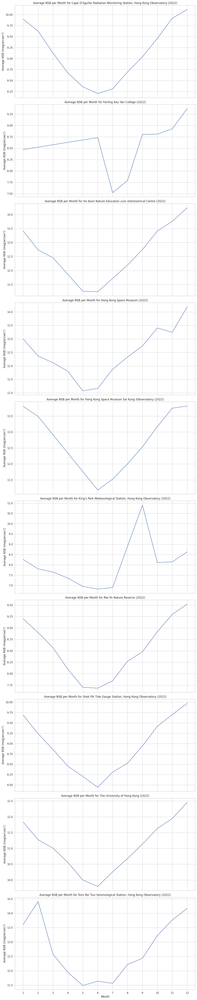

In [ ]:
# 8. Group by location and month, then calculate the average NSB (night sky brightness)
monthly_avg_nsb_by_location = (
    all_data_with_location.groupby(['location', 'month'])['nsb']
    .mean()
    .reset_index()
)

# Inspect the grouped data
print("Preview of data grouped by location and month:")
print(monthly_avg_nsb_by_location.head())

# **New code: Save the data as a CSV file**
output_csv_path = "/content/drive/MyDrive/monthly_avg_nsb_by_location.csv"
monthly_avg_nsb_by_location.to_csv(output_csv_path, index=False, encoding='utf-8')
print(f"Data has been saved to {output_csv_path}")

# 9. Get all unique locations
locations = monthly_avg_nsb_by_location['location'].unique()

# Create a grid of subplots, one for each location
fig, axes = plt.subplots(nrows=len(locations), ncols=1, figsize=(12, 6 * len(locations)), sharex=True)

# Handle case when there's only one location (axes is not an array)
if len(locations) == 1:
    axes = [axes]

for i, location in enumerate(locations):
    # Extract data for the current location
    data = monthly_avg_nsb_by_location[monthly_avg_nsb_by_location['location'] == location]

    # Plot line plot
    sns.lineplot(x='month', y='nsb', data=data, ax=axes[i])

    # Set subplot title and labels
    axes[i].set_title(f"Average NSB per Month for {location} (2022)")
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Average NSB (mag/arcsec²)')
    axes[i].set_xticks(range(1, 13))  # Show months from 1 to 12

# Adjust layout
plt.tight_layout()
plt.show()

# 2. 绘制 4 个季度的光强变化图

按观测点和季度分组后的数据预览：
                                            location quarter       nsb
0  Cape D'Aguilar Radiation Monitoring Station, H...      Q1  9.546423
1  Cape D'Aguilar Radiation Monitoring Station, H...      Q2  8.411471
2  Cape D'Aguilar Radiation Monitoring Station, H...      Q3  8.679160
3  Cape D'Aguilar Radiation Monitoring Station, H...      Q4  9.833545
4                            Fanling Kau Yan College      Q1  8.471904
数据已保存到 /content/drive/MyDrive/quarterly_avg_nsb_by_location.csv


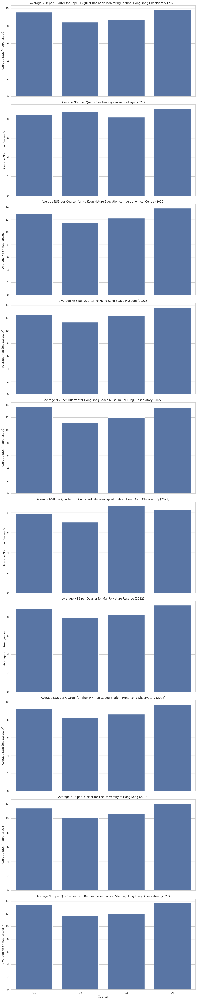

In [ ]:
# 8. Define quarter mapping based on month
quarter_mapping = {
    1: 'Q1', 2: 'Q1', 3: 'Q1',
    4: 'Q2', 5: 'Q2', 6: 'Q2',
    7: 'Q3', 8: 'Q3', 9: 'Q3',
    10: 'Q4', 11: 'Q4', 12: 'Q4'
}

# Add a new column for quarter
all_data_with_location['quarter'] = all_data_with_location['month'].map(quarter_mapping)

# Group by location and quarter, then calculate the average NSB (night sky brightness)
quarterly_avg_nsb_by_location = (
    all_data_with_location.groupby(['location', 'quarter'])['nsb']
    .mean()
    .reset_index()
)

# Inspect the grouped data
print("Preview of data grouped by location and quarter:")
print(quarterly_avg_nsb_by_location.head())

# **New code: Save the data as a CSV file**
output_csv_path = "/content/drive/MyDrive/quarterly_avg_nsb_by_location.csv"
quarterly_avg_nsb_by_location.to_csv(output_csv_path, index=False, encoding='utf-8')
print(f"Data has been saved to {output_csv_path}")

# 9. Get all unique locations
locations = quarterly_avg_nsb_by_location['location'].unique()

# Create a grid of subplots, one for each location
fig, axes = plt.subplots(nrows=len(locations), ncols=1, figsize=(12, 6 * len(locations)), sharex=True)

# Handle case when there's only one location (axes is not an array)
if len(locations) == 1:
    axes = [axes]

for i, location in enumerate(locations):
    # Extract data for the current location
    data = quarterly_avg_nsb_by_location[quarterly_avg_nsb_by_location['location'] == location]

    # Plot bar chart
    sns.barplot(x='quarter', y='nsb', data=data, ax=axes[i], order=['Q1', 'Q2', 'Q3', 'Q4'])

    # Set subplot title and labels
    axes[i].set_title(f"Average NSB per Quarter for {location} (2022)")
    axes[i].set_xlabel('Quarter')
    axes[i].set_ylabel('Average NSB (mag/arcsec²)')

# Adjust layout
plt.tight_layout()
plt.show()

# 3. 绘制每月内每天每个时刻的光强变化图

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 1 月数据...


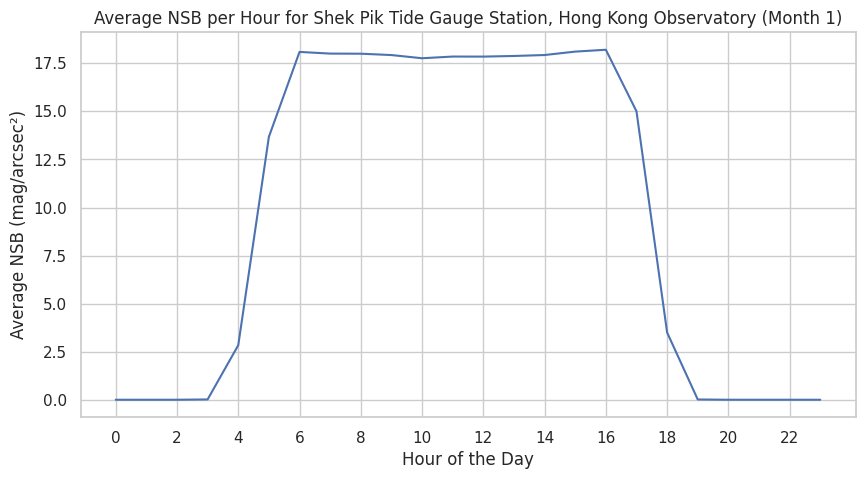

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 2 月数据...


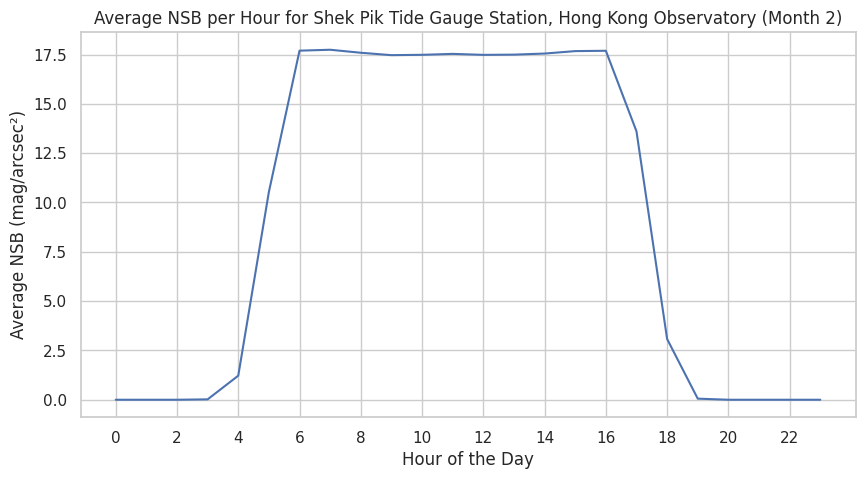

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 3 月数据...


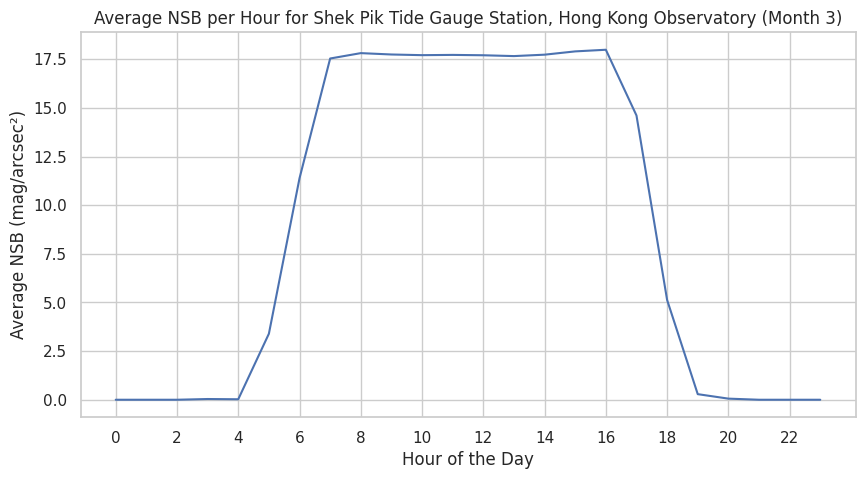

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 4 月数据...


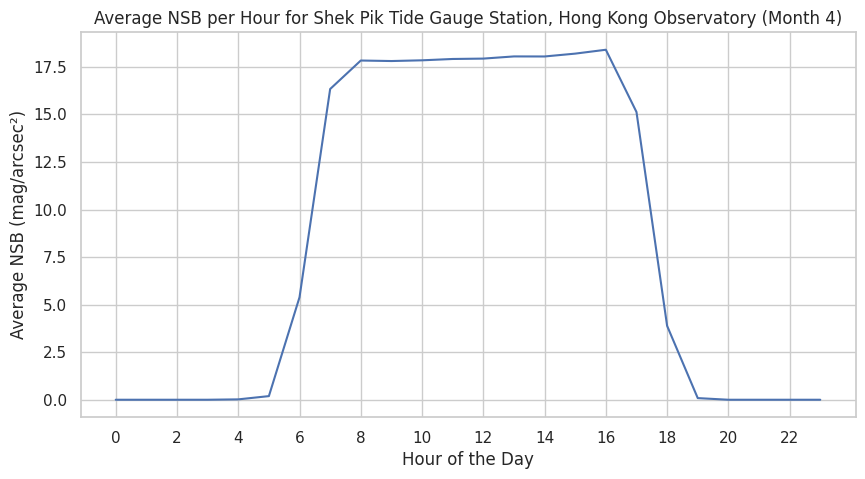

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 5 月数据...


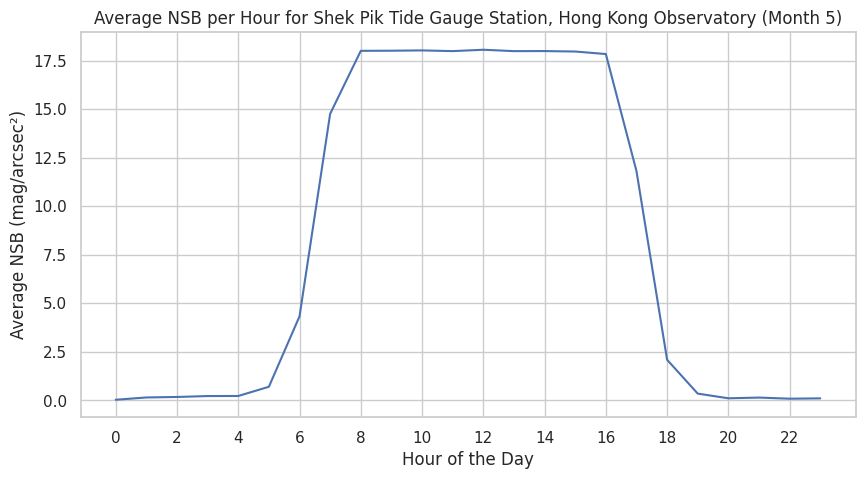

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 6 月数据...


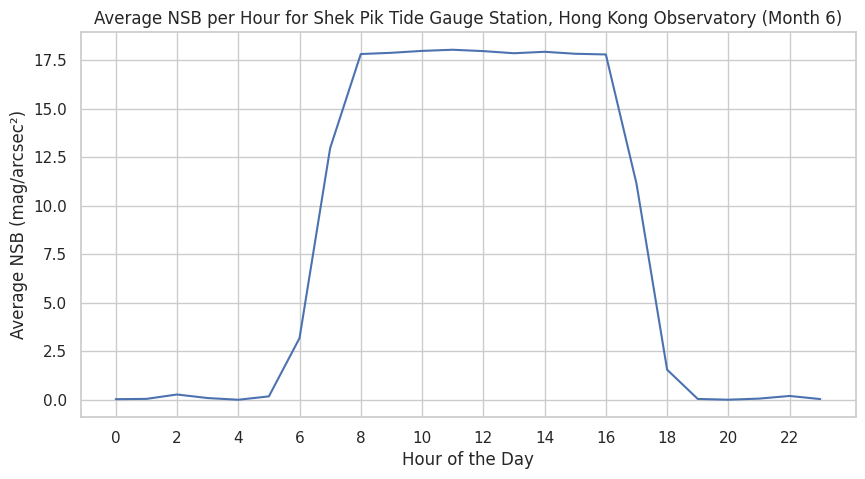

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 7 月数据...


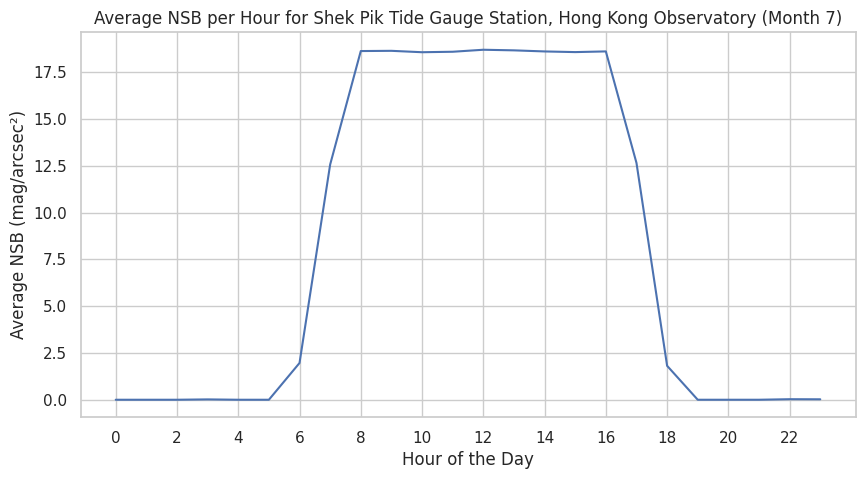

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 8 月数据...


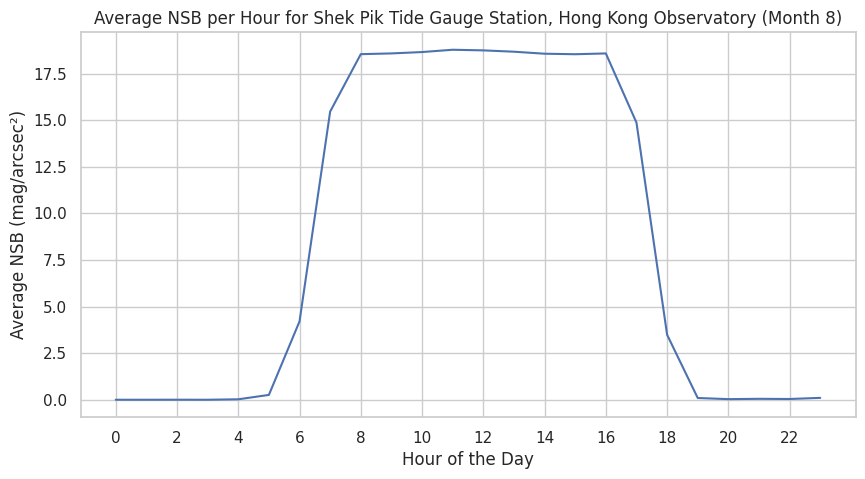

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 9 月数据...


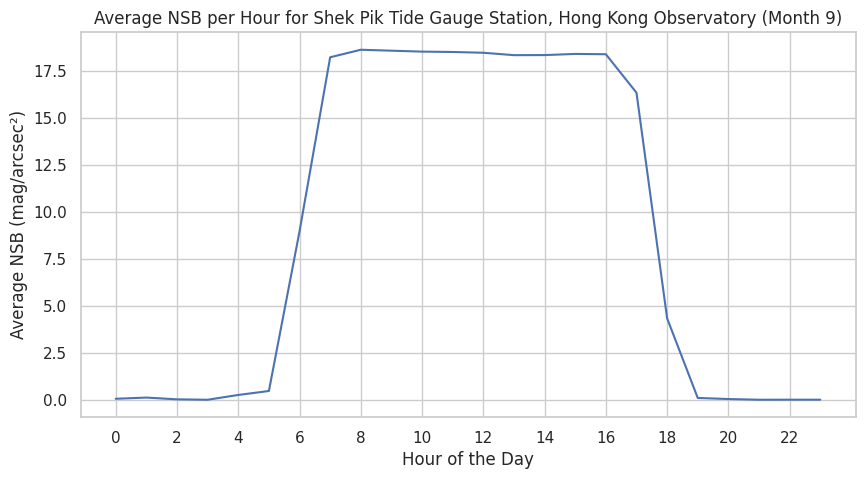

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 10 月数据...


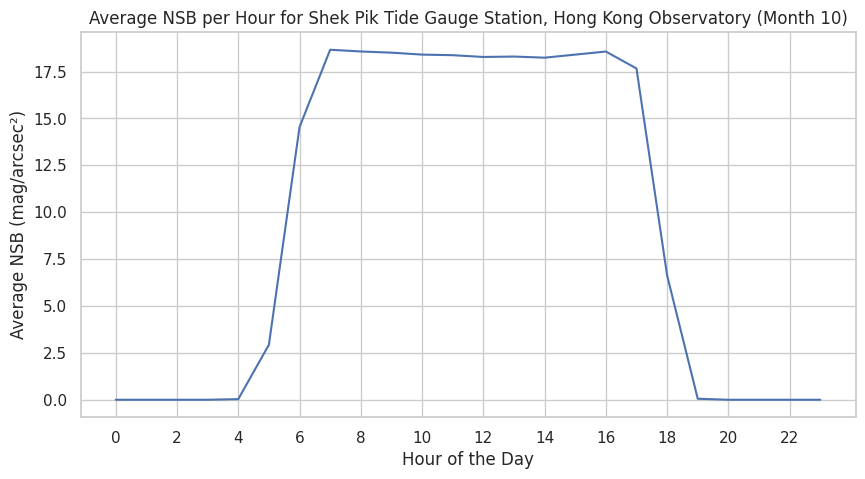

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 11 月数据...


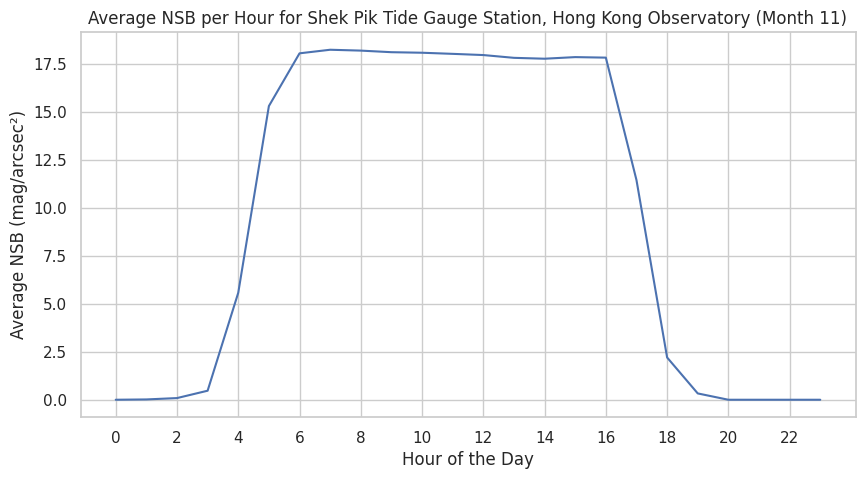

  正在分析 Shek Pik Tide Gauge Station, Hong Kong Observatory 的 12 月数据...


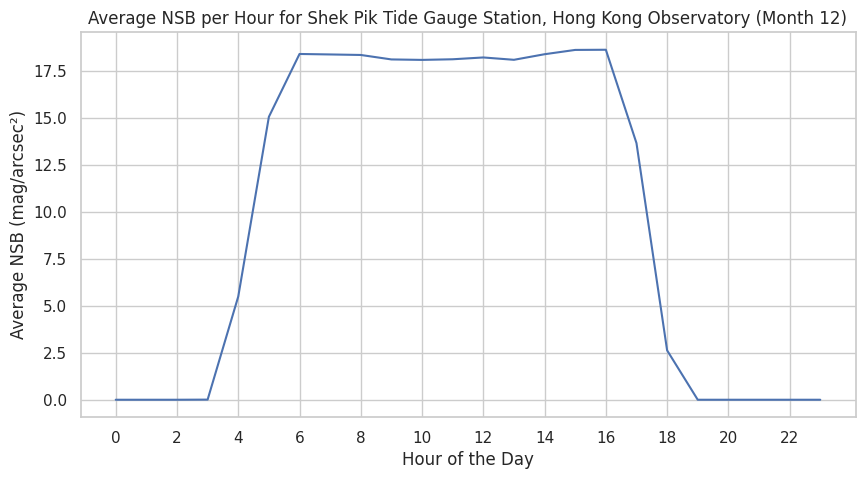

  正在分析 Hong Kong Space Museum 的 1 月数据...


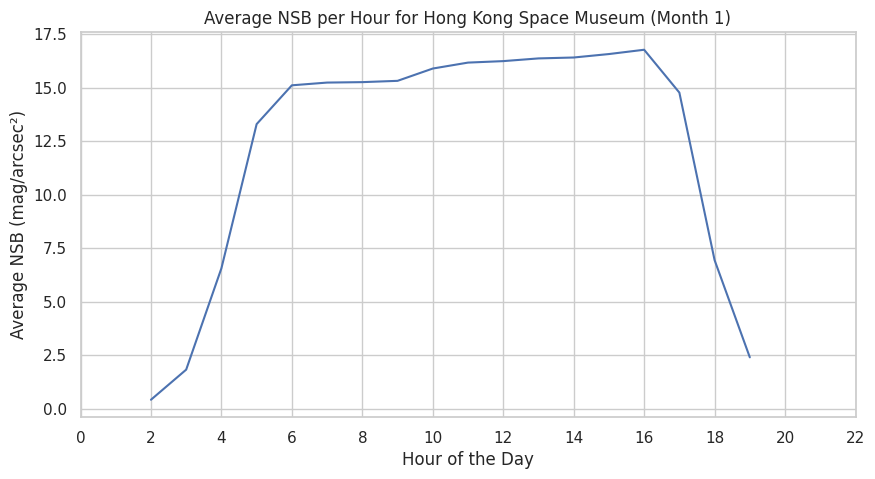

  正在分析 Hong Kong Space Museum 的 2 月数据...


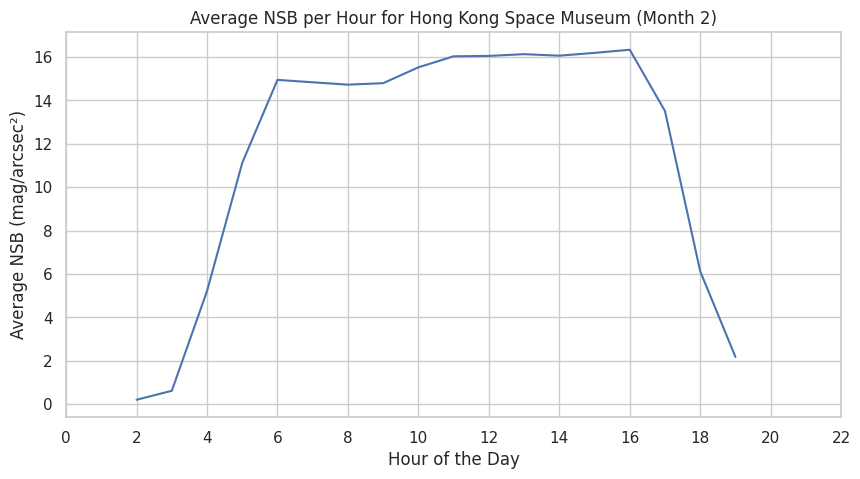

  正在分析 Hong Kong Space Museum 的 3 月数据...


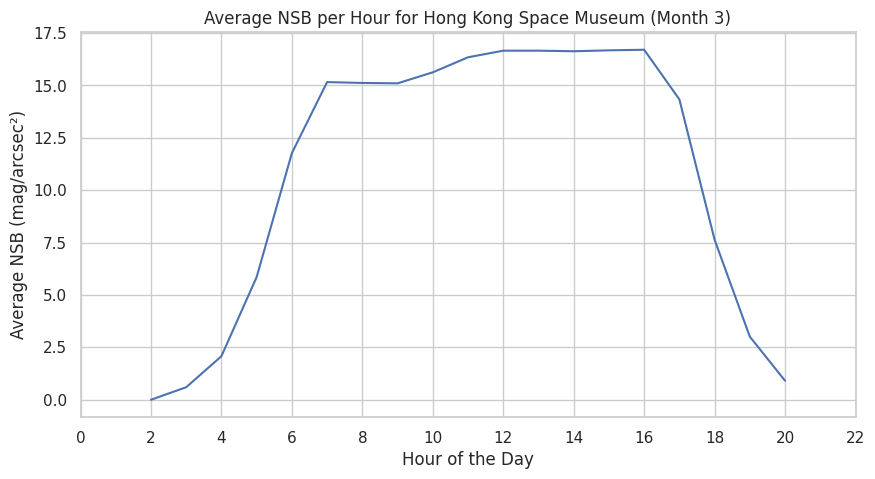

  正在分析 Hong Kong Space Museum 的 4 月数据...


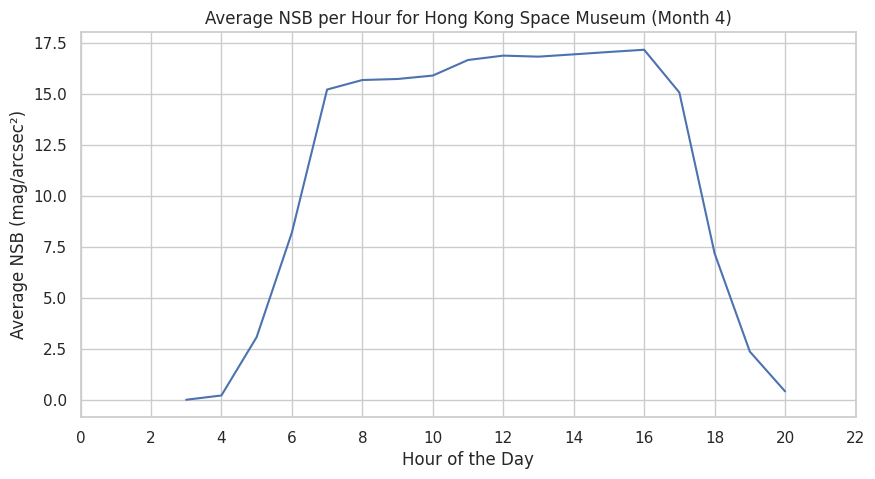

  正在分析 Hong Kong Space Museum 的 5 月数据...


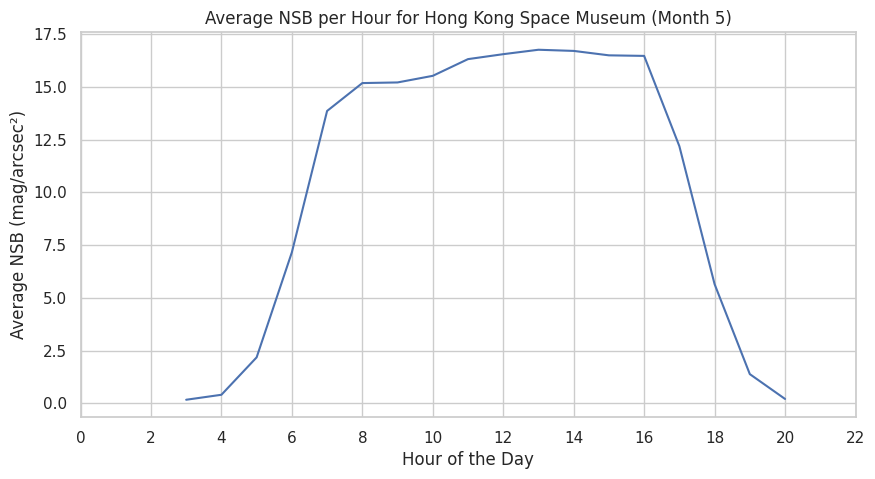

  正在分析 Hong Kong Space Museum 的 6 月数据...


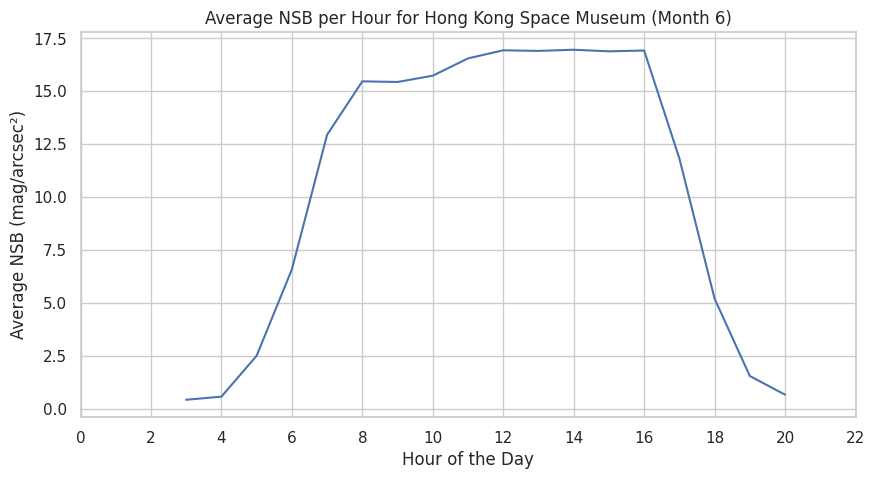

  正在分析 Hong Kong Space Museum 的 7 月数据...


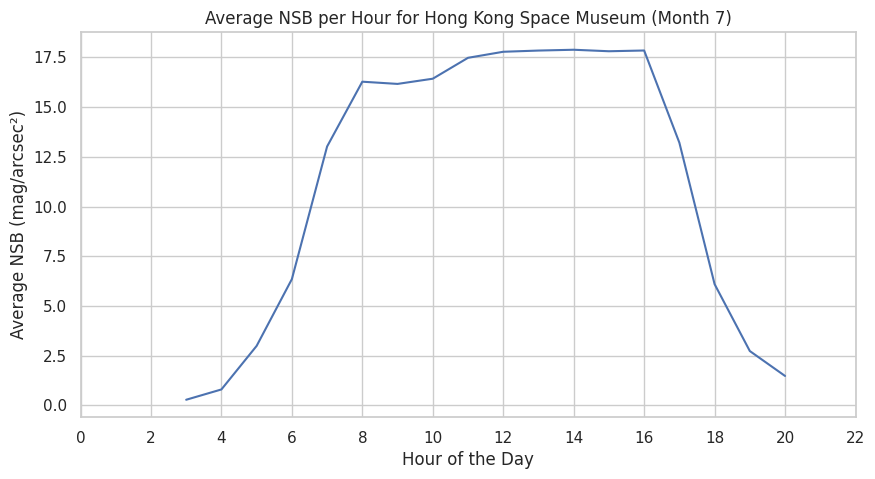

  正在分析 Hong Kong Space Museum 的 8 月数据...


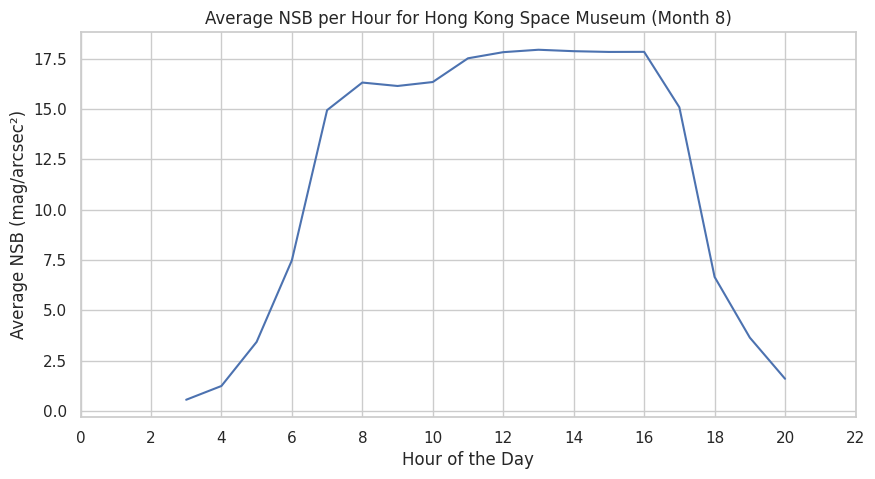

  正在分析 Hong Kong Space Museum 的 9 月数据...


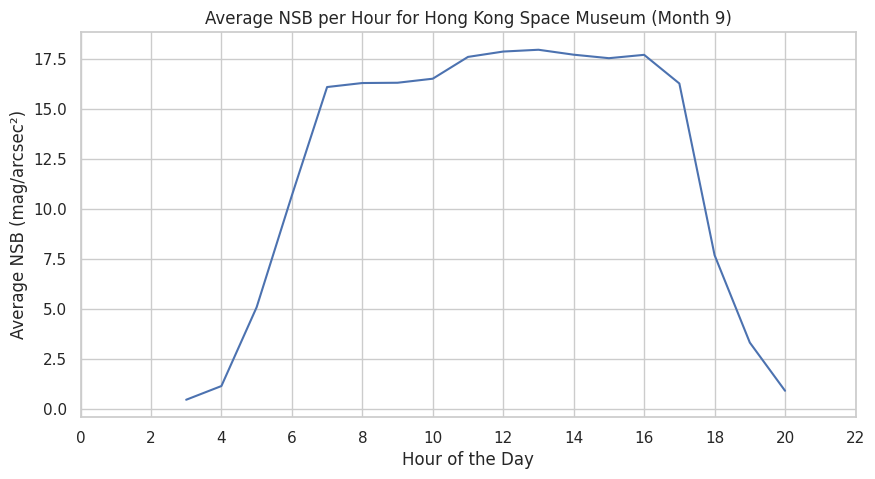

  正在分析 Hong Kong Space Museum 的 10 月数据...


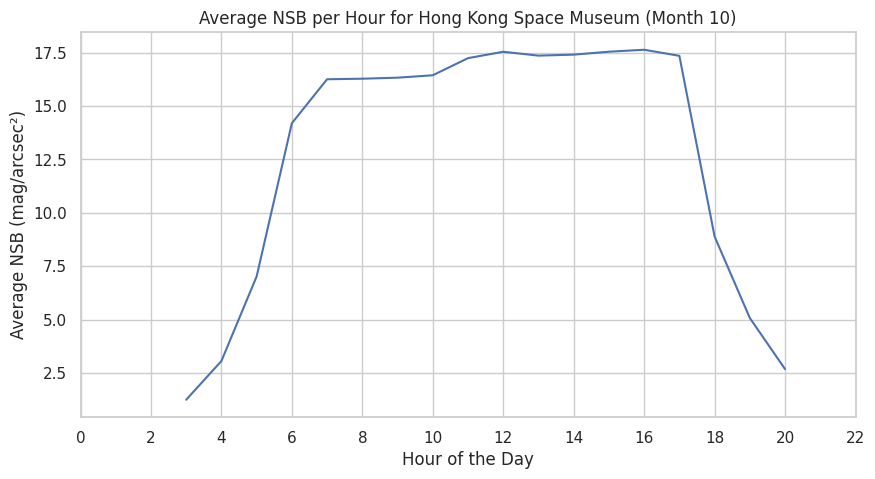

  正在分析 Hong Kong Space Museum 的 11 月数据...


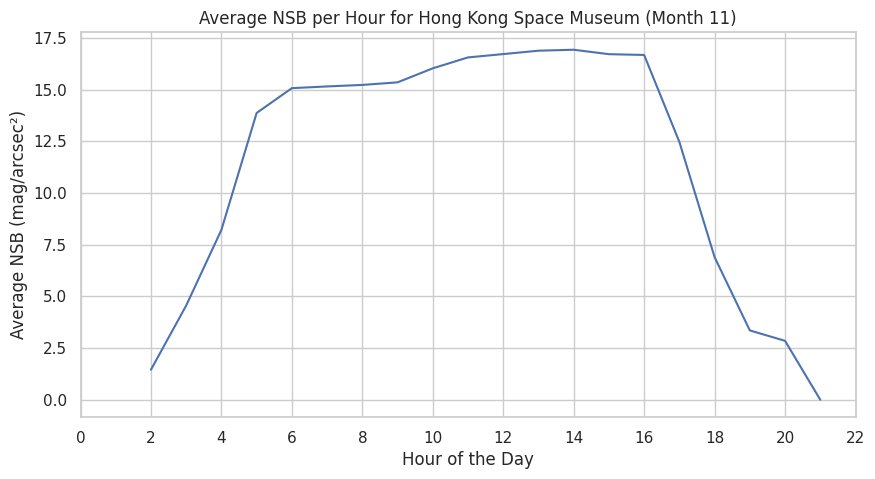

  正在分析 Hong Kong Space Museum 的 12 月数据...


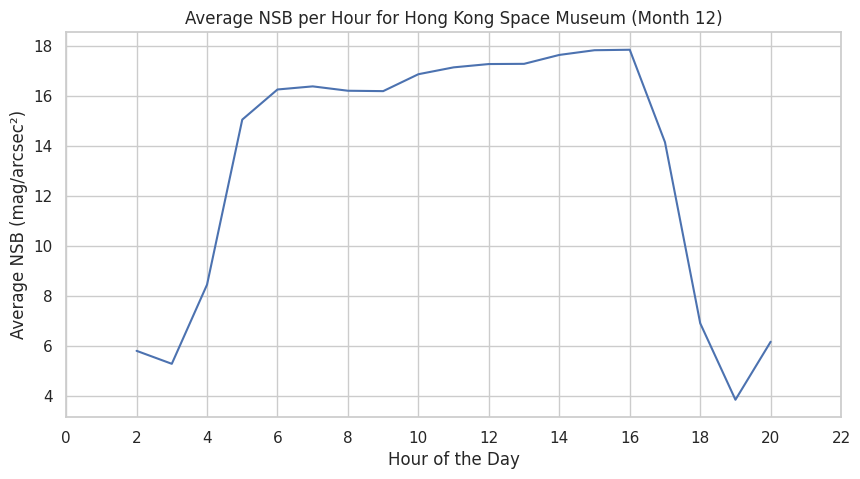

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 1 月数据...


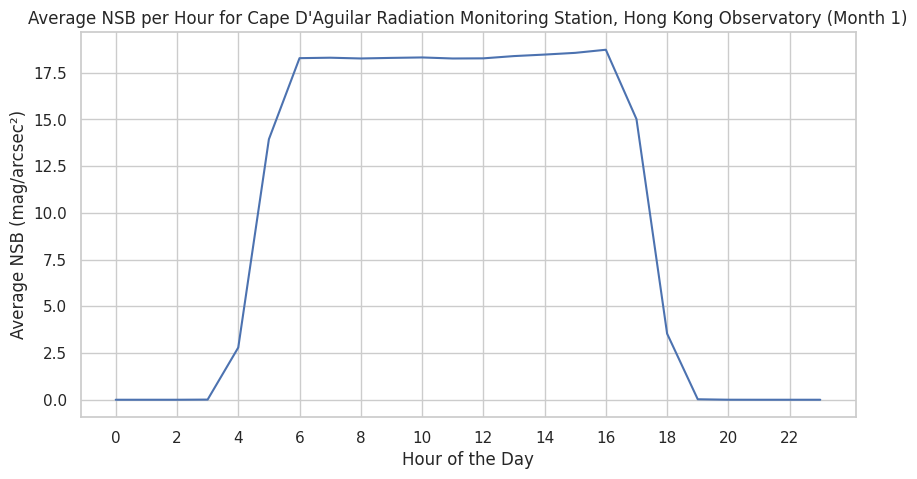

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 2 月数据...


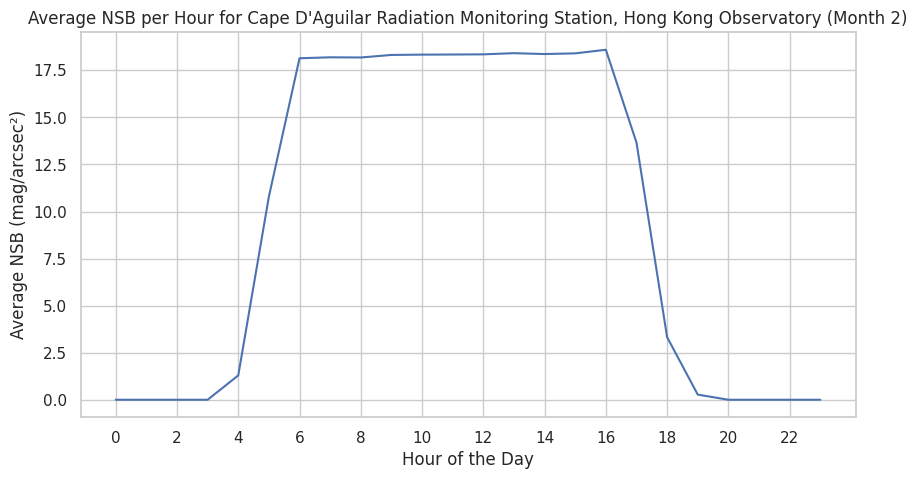

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 3 月数据...


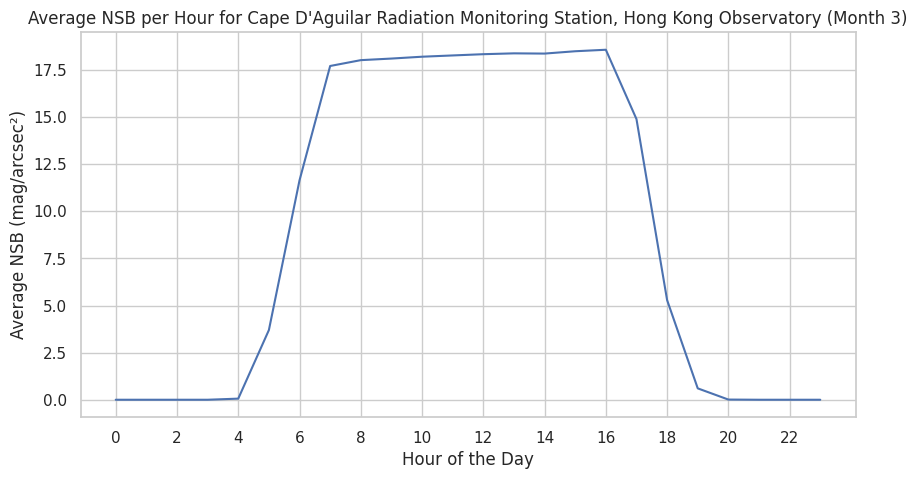

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 4 月数据...


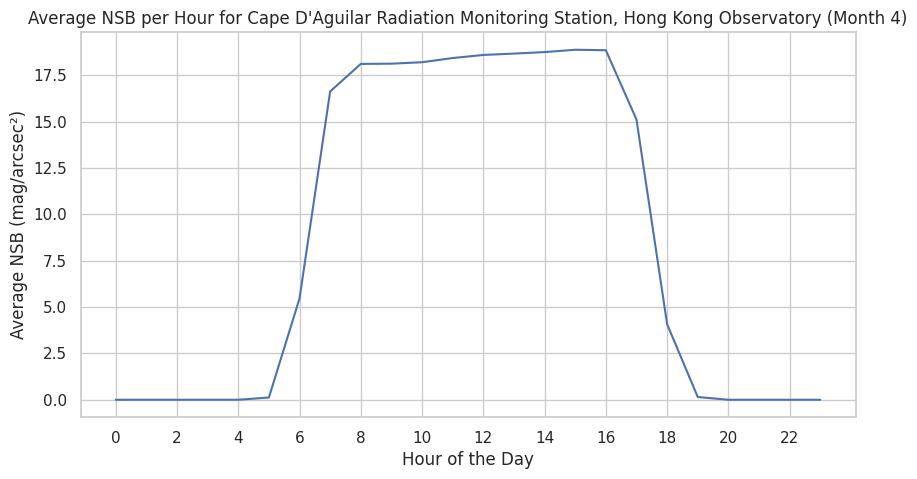

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 5 月数据...


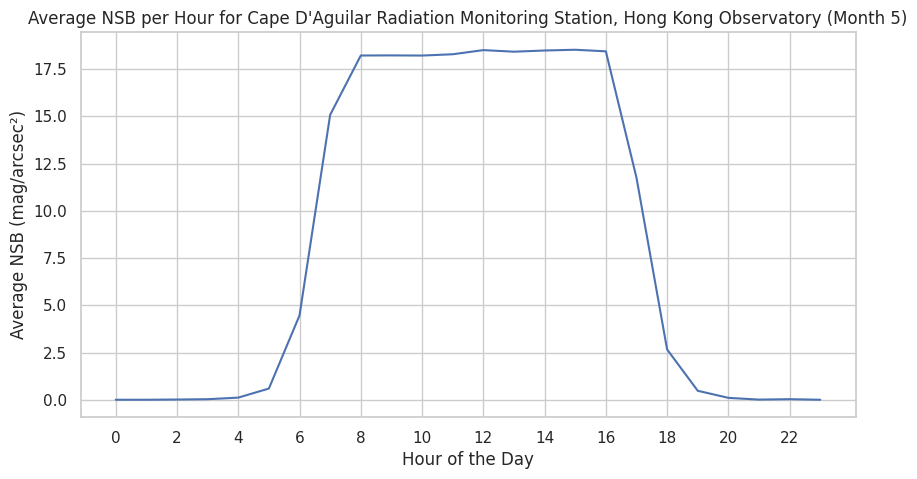

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 6 月数据...


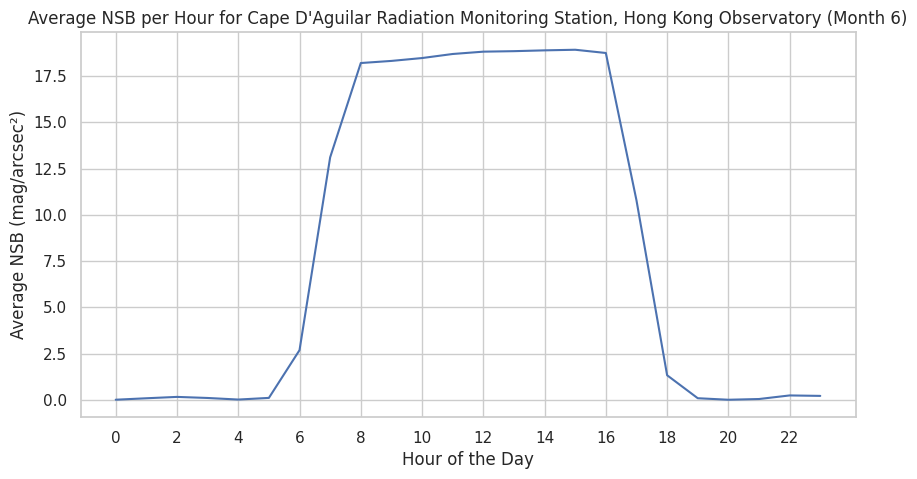

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 7 月数据...


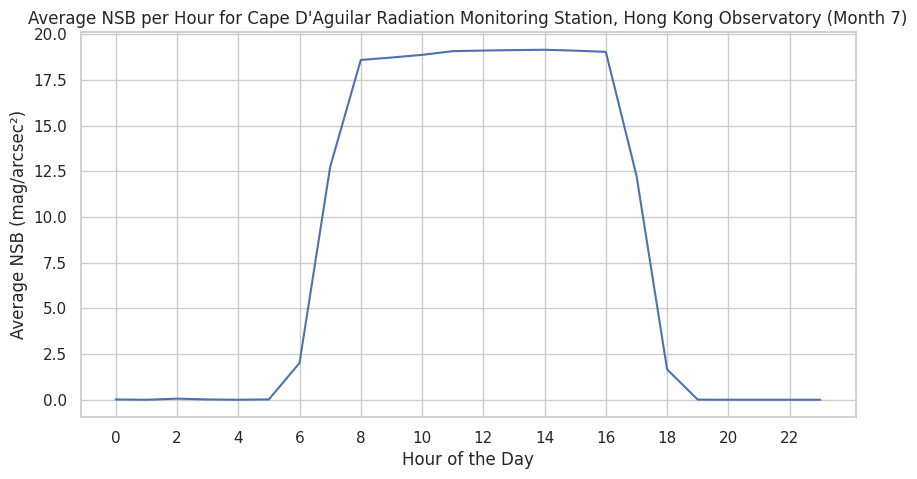

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 8 月数据...


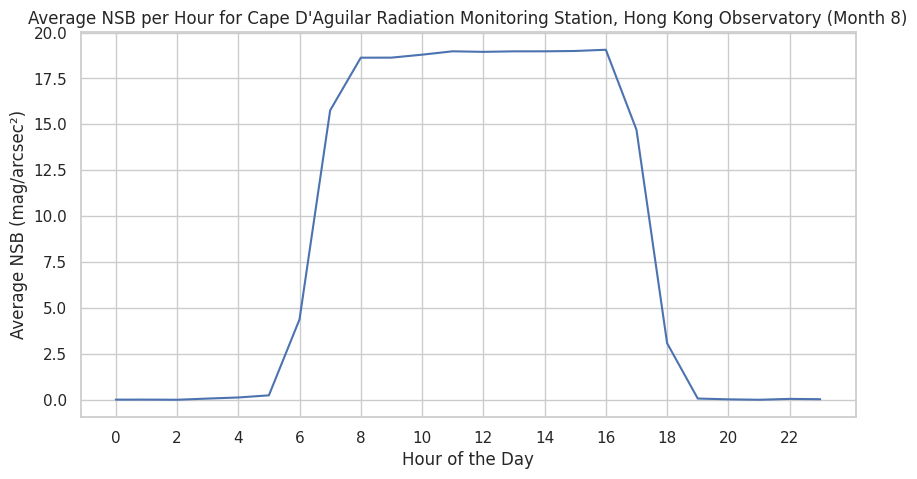

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 9 月数据...


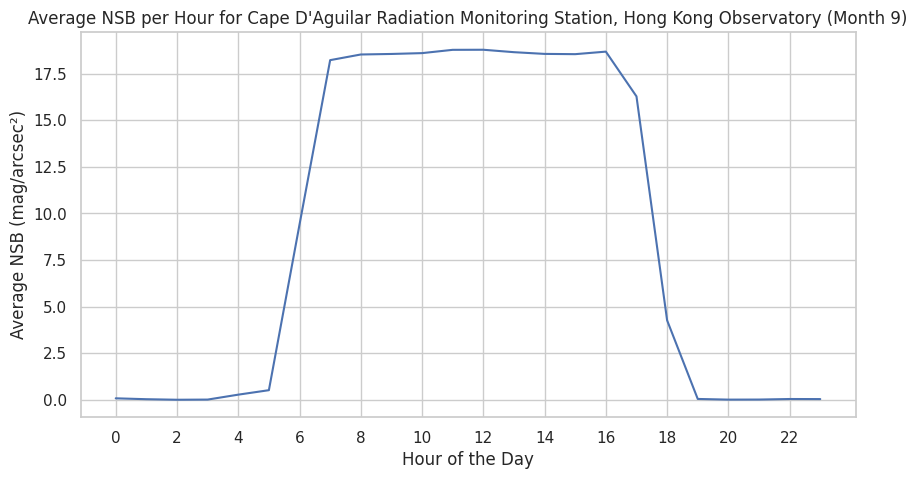

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 10 月数据...


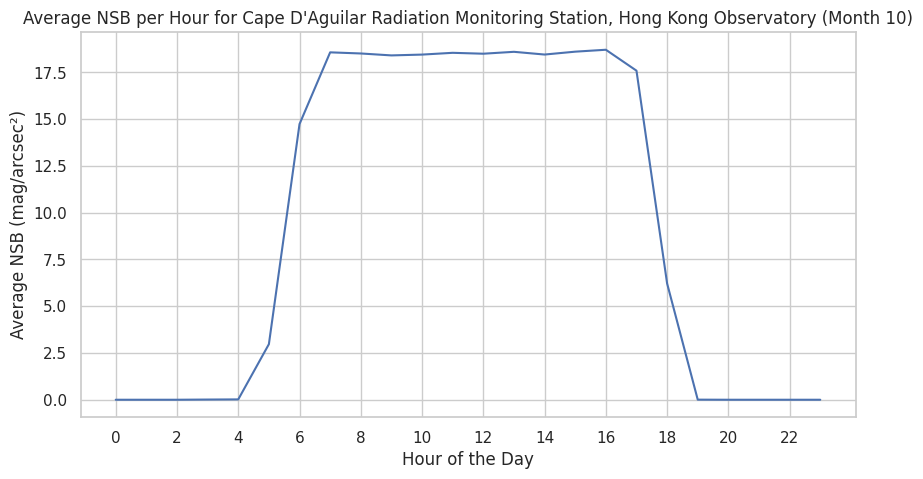

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 11 月数据...


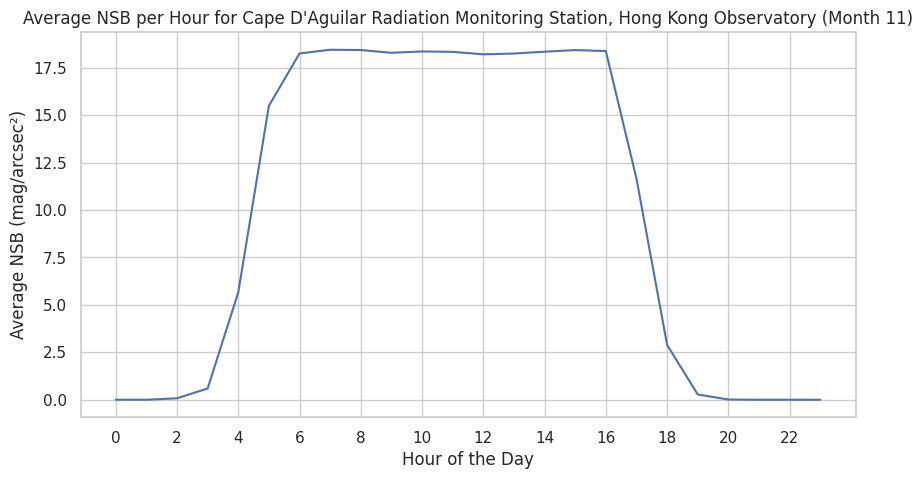

  正在分析 Cape D'Aguilar Radiation Monitoring Station, Hong Kong Observatory 的 12 月数据...


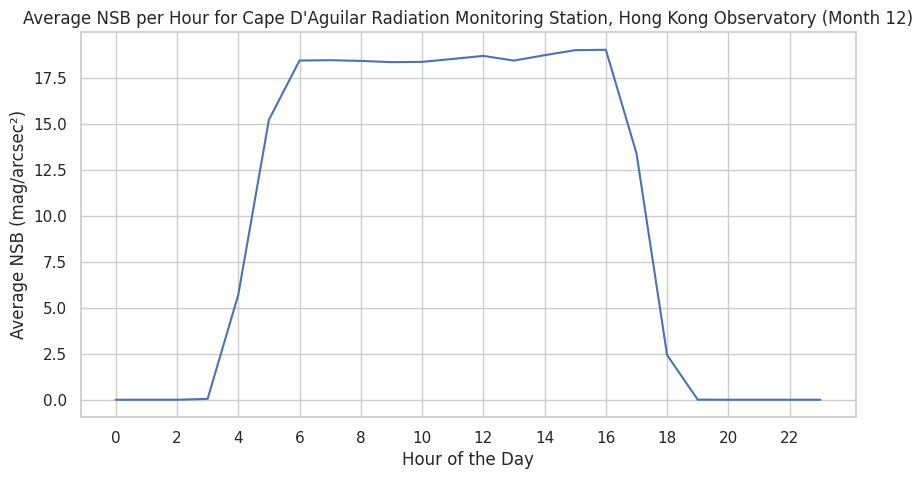

  正在分析 Fanling Kau Yan College 的 1 月数据...


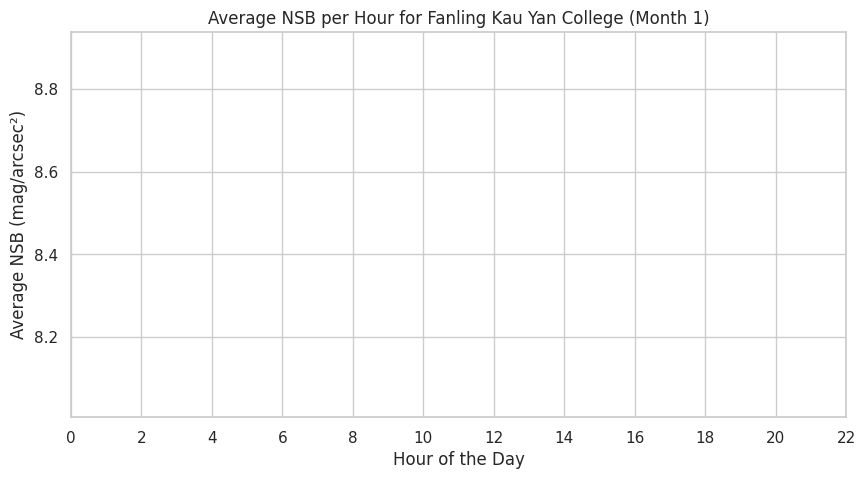

  正在分析 Fanling Kau Yan College 的 6 月数据...


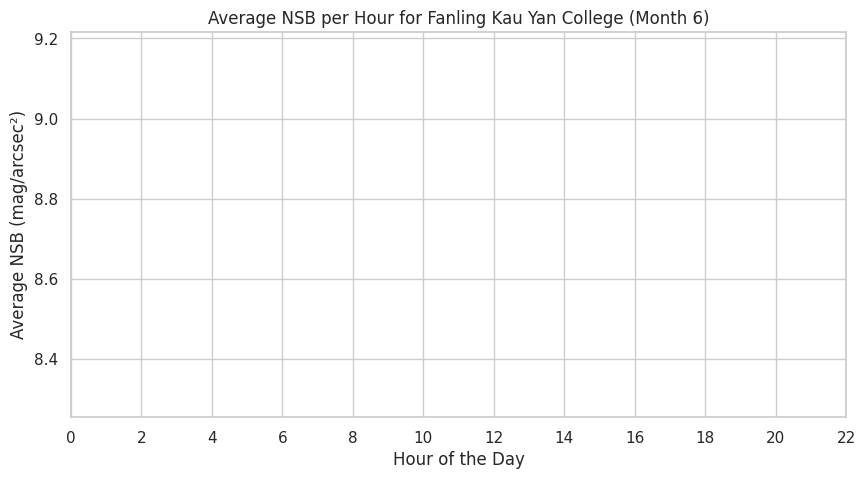

  正在分析 Fanling Kau Yan College 的 7 月数据...


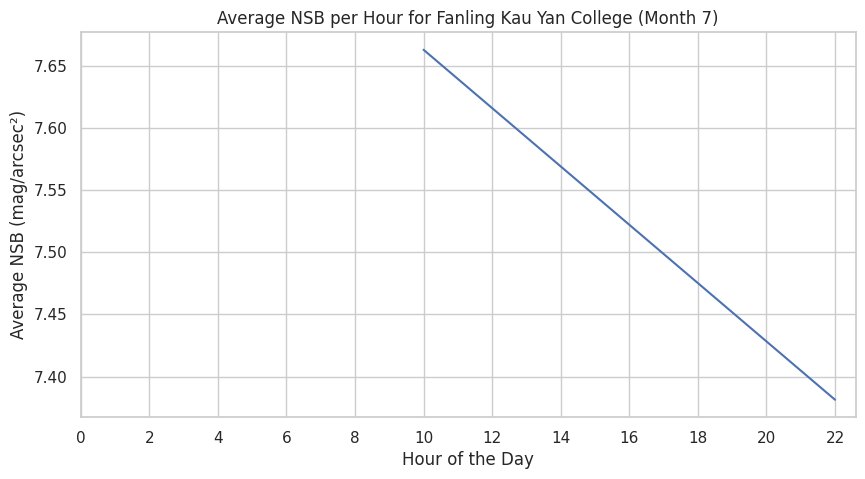

  正在分析 Fanling Kau Yan College 的 8 月数据...


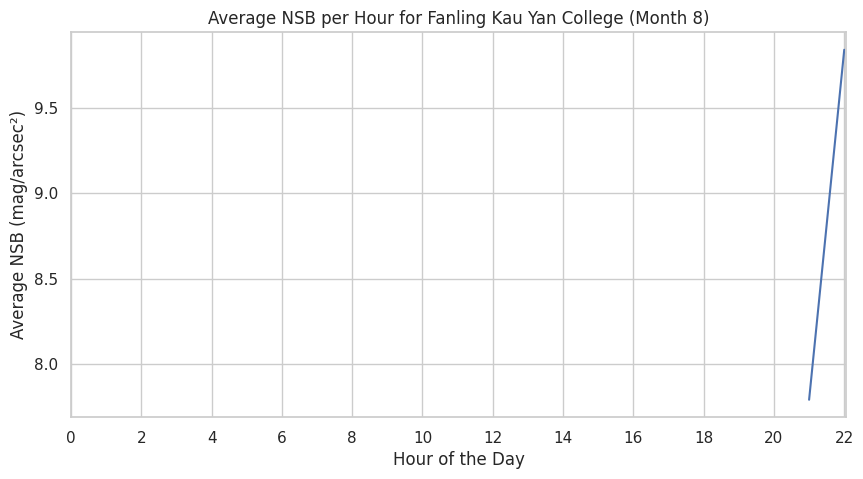

  正在分析 Fanling Kau Yan College 的 9 月数据...


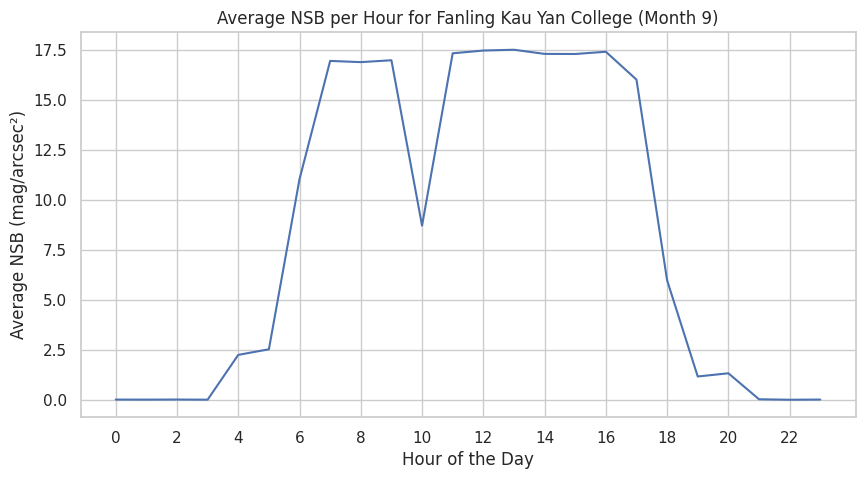

  正在分析 Fanling Kau Yan College 的 10 月数据...


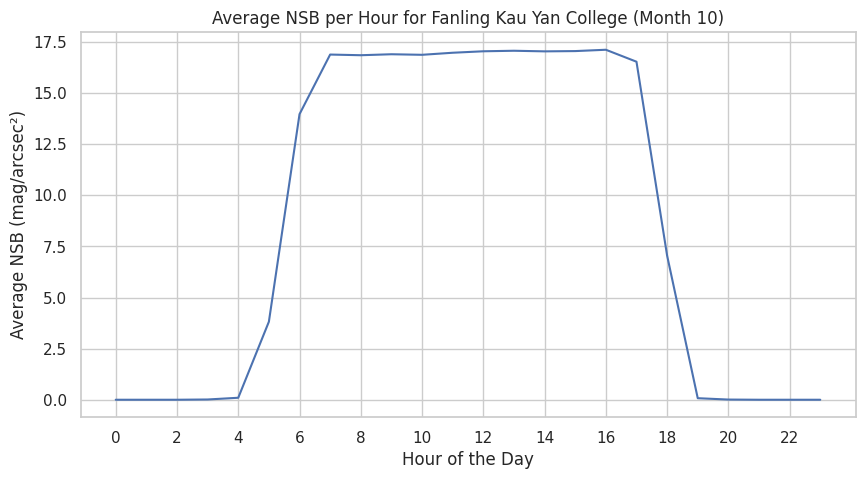

  正在分析 Fanling Kau Yan College 的 11 月数据...


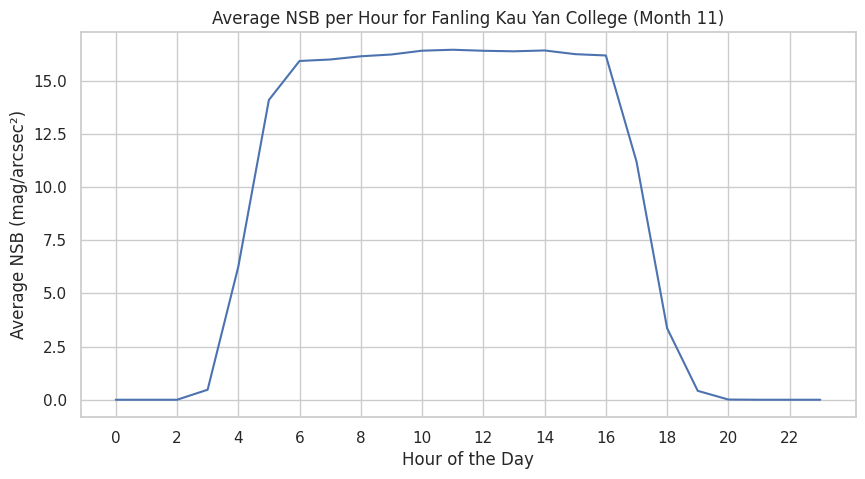

  正在分析 Fanling Kau Yan College 的 12 月数据...


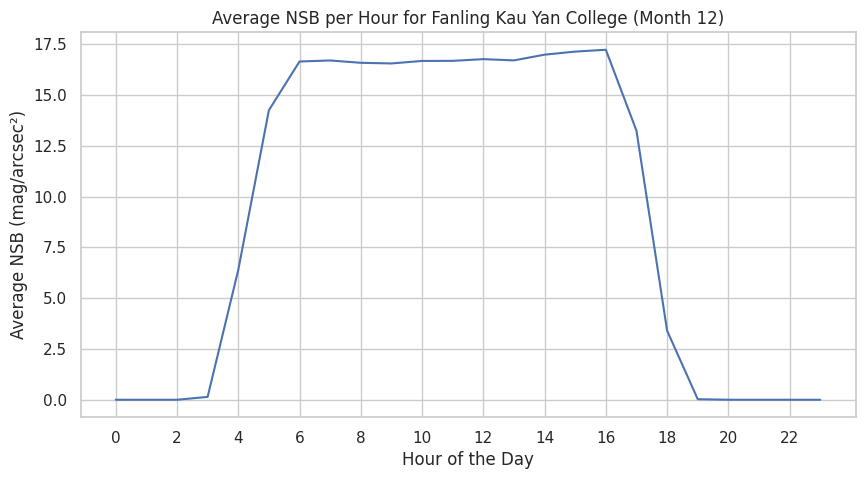

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 1 月数据...


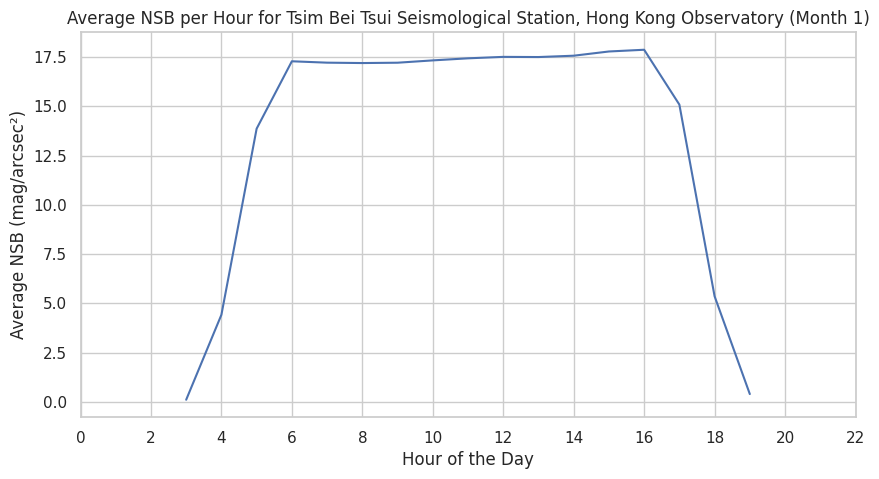

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 2 月数据...


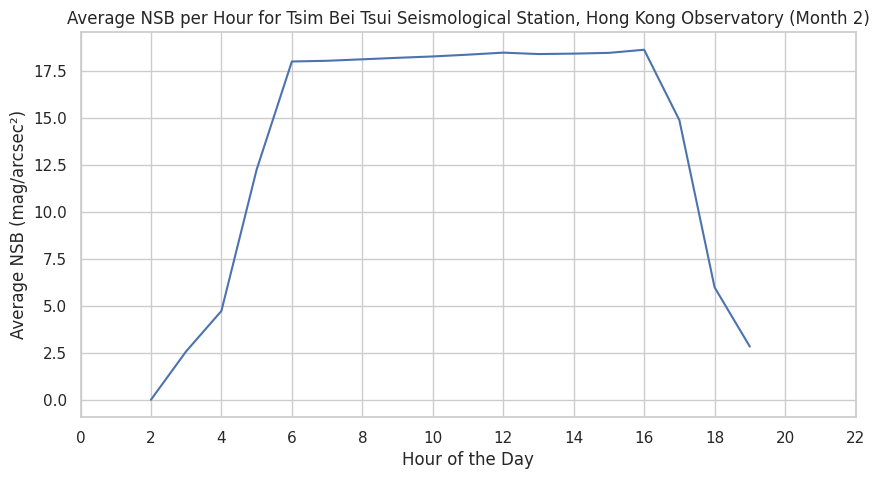

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 3 月数据...


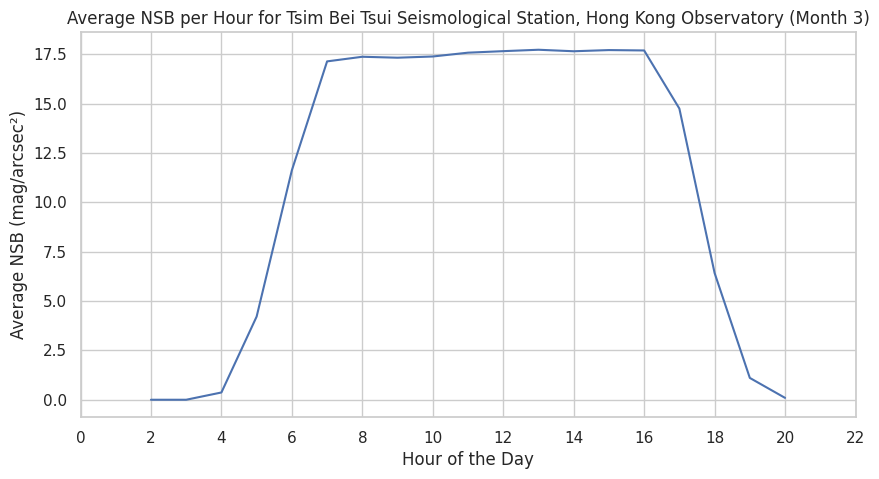

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 4 月数据...


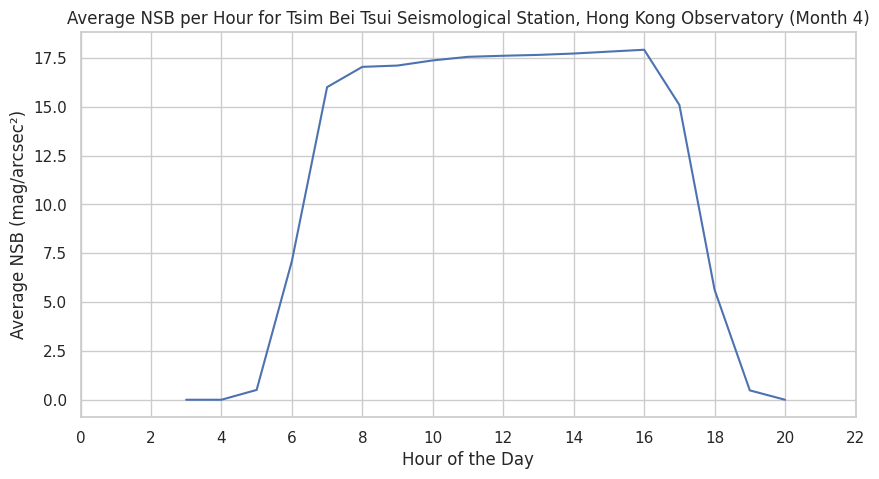

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 5 月数据...


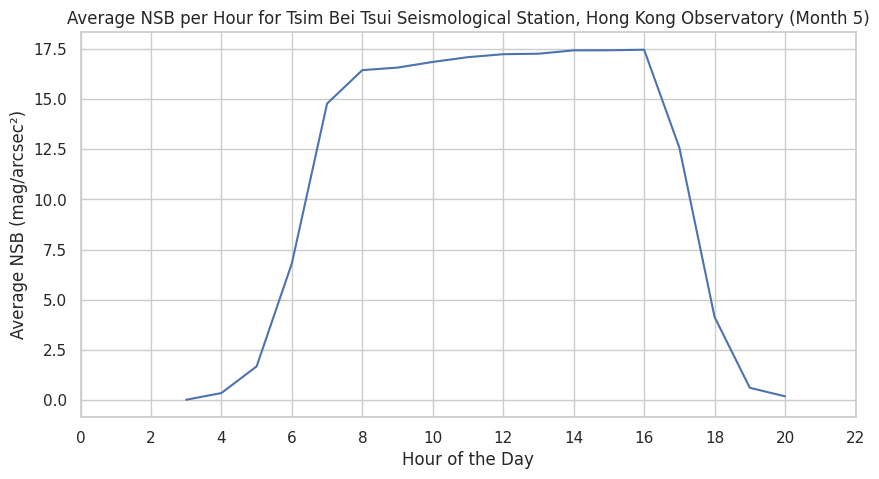

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 6 月数据...


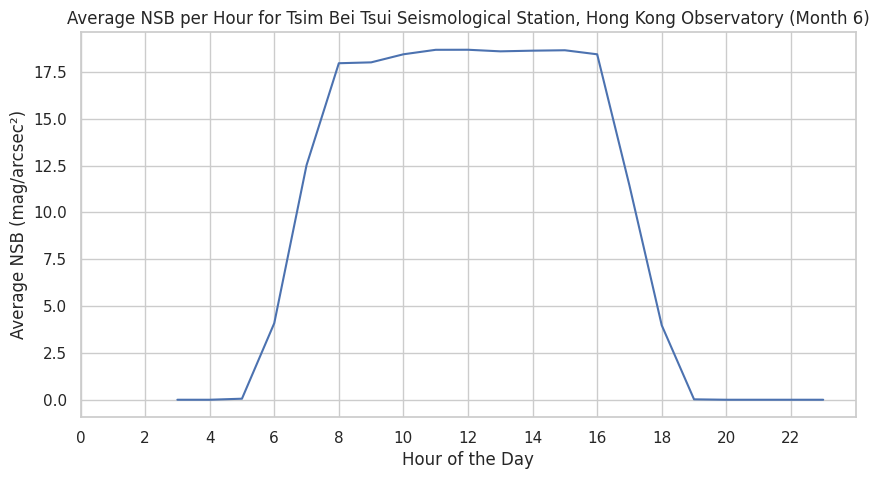

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 7 月数据...


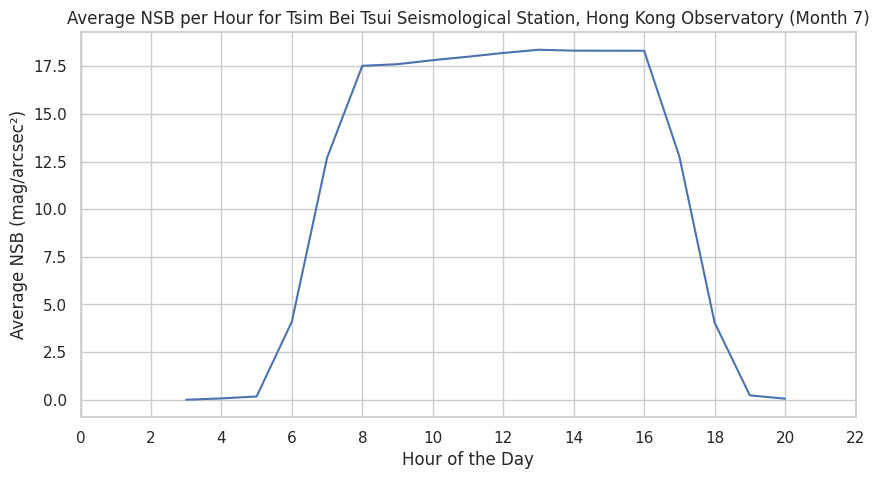

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 8 月数据...


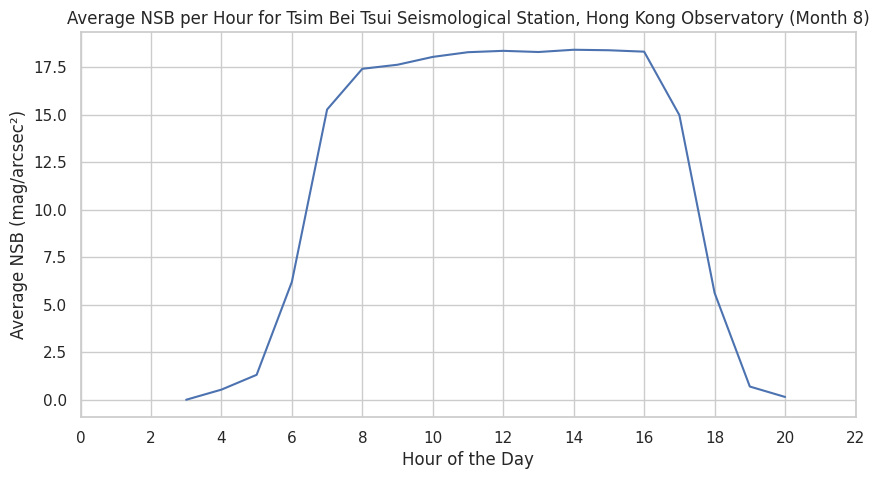

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 9 月数据...


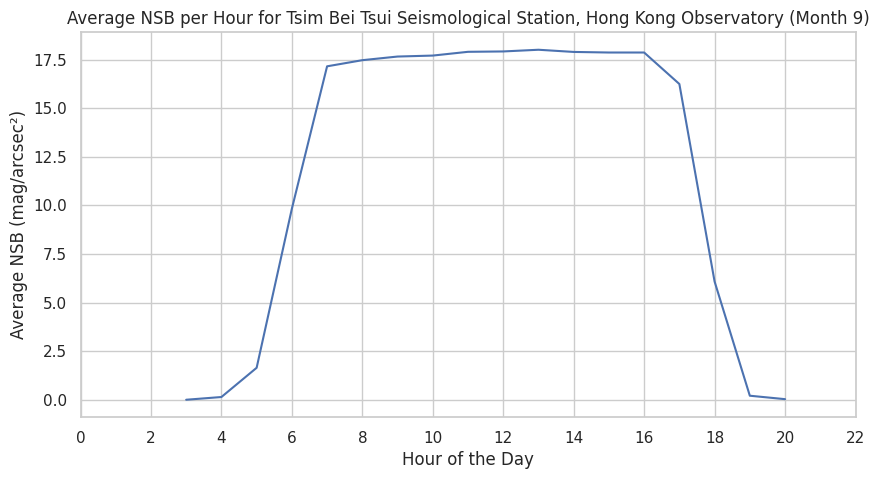

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 10 月数据...


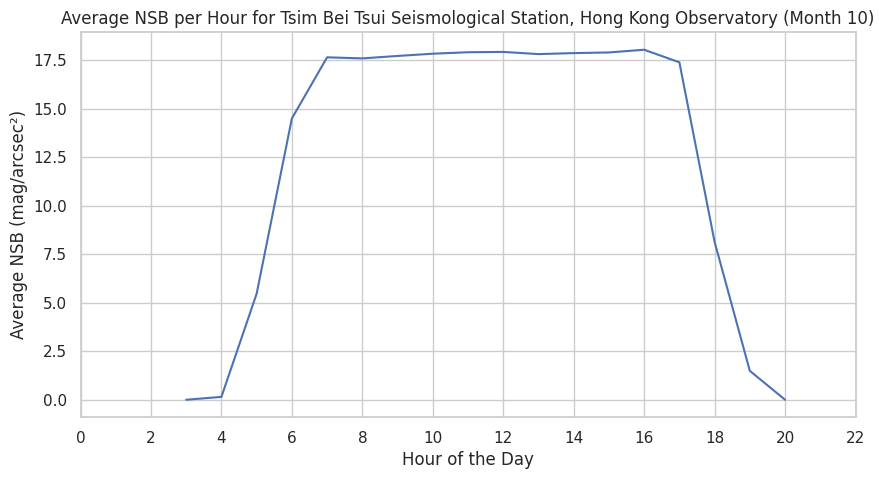

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 11 月数据...


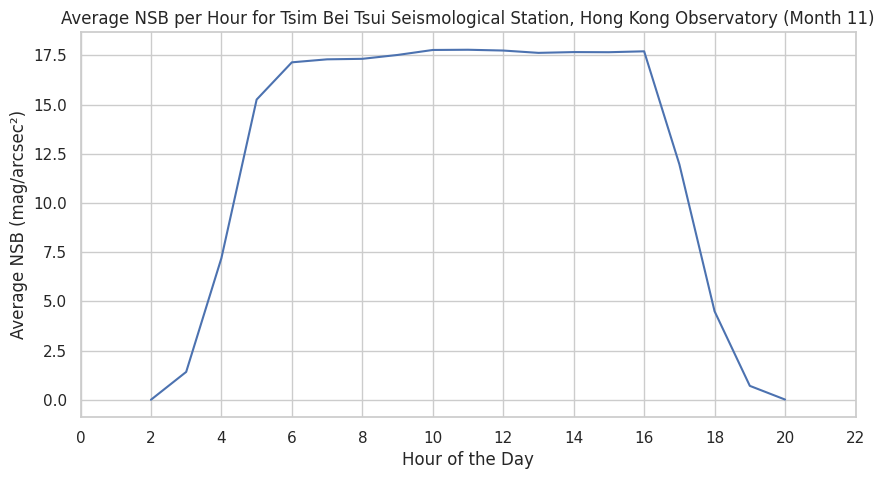

  正在分析 Tsim Bei Tsui Seismological Station, Hong Kong Observatory 的 12 月数据...


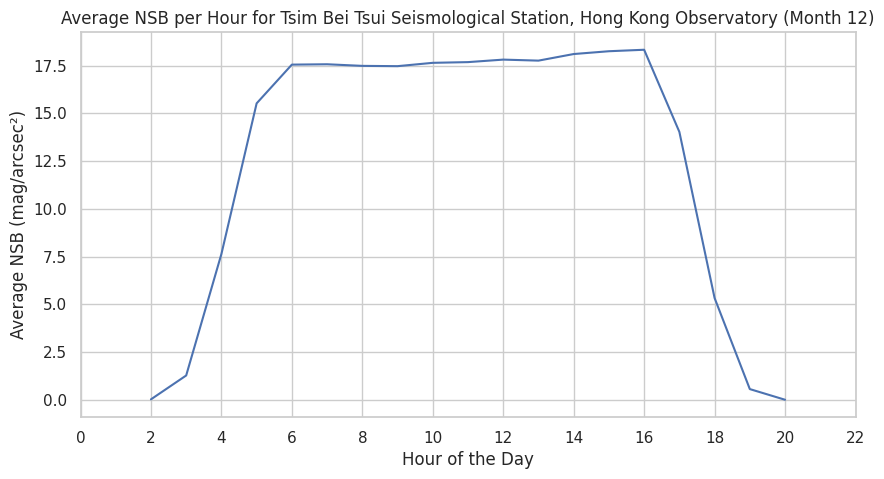

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 1 月数据...


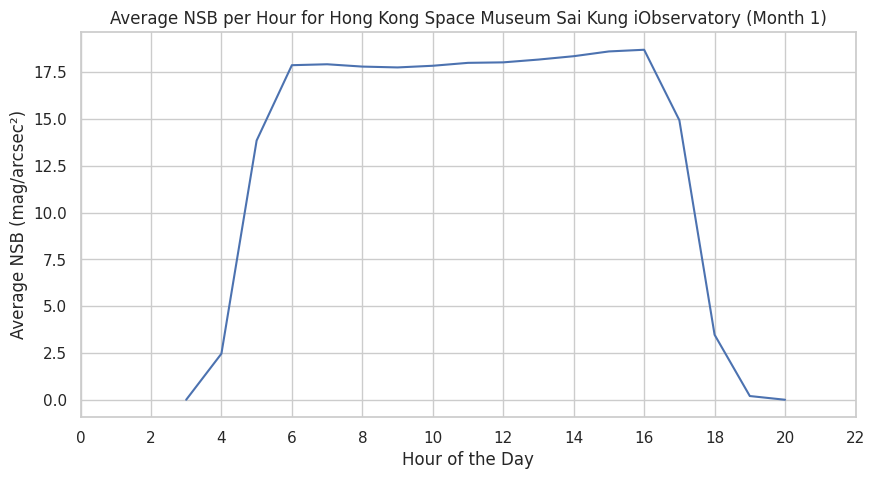

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 2 月数据...


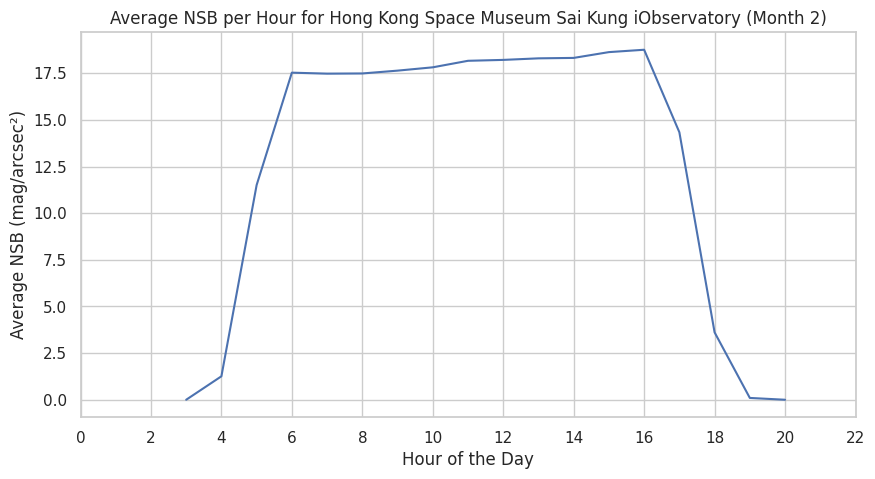

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 6 月数据...


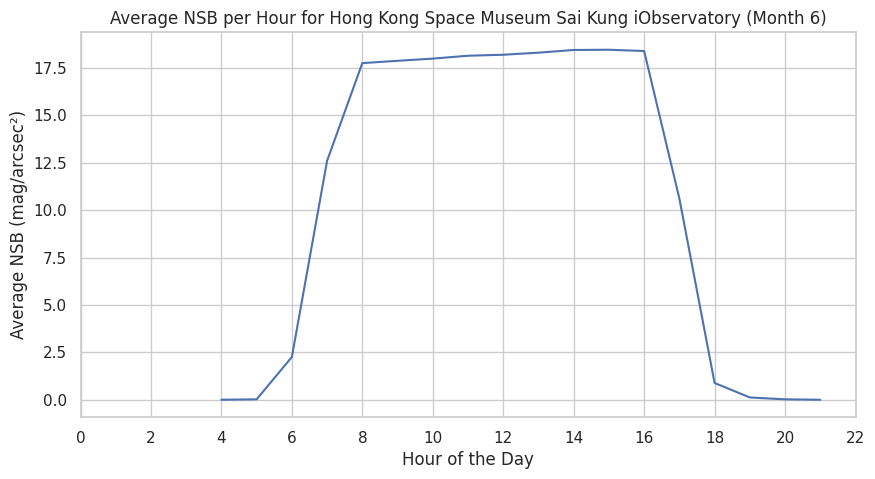

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 7 月数据...


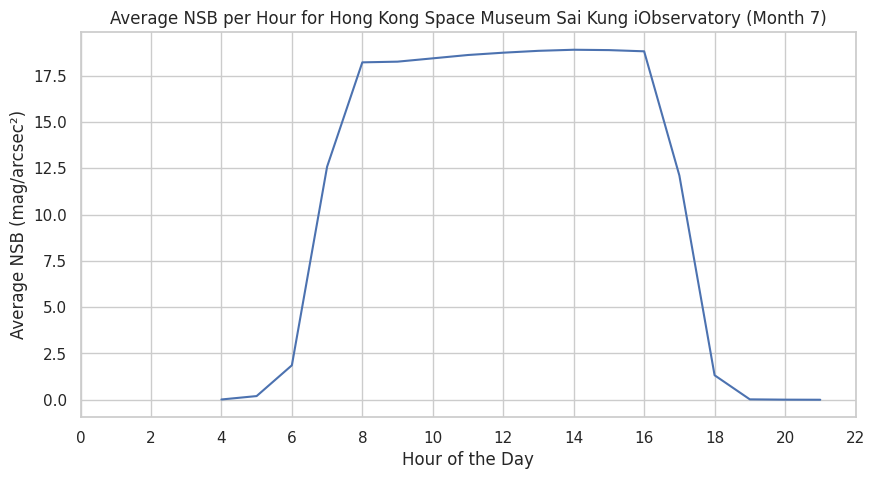

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 8 月数据...


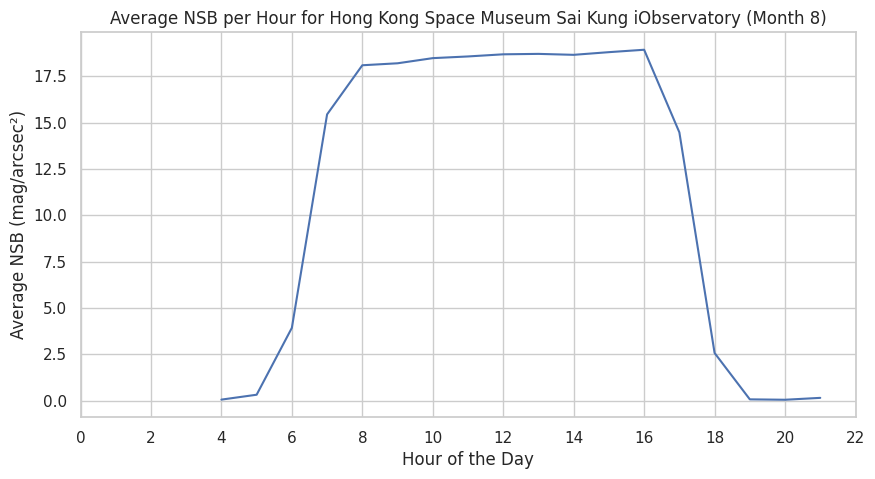

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 9 月数据...


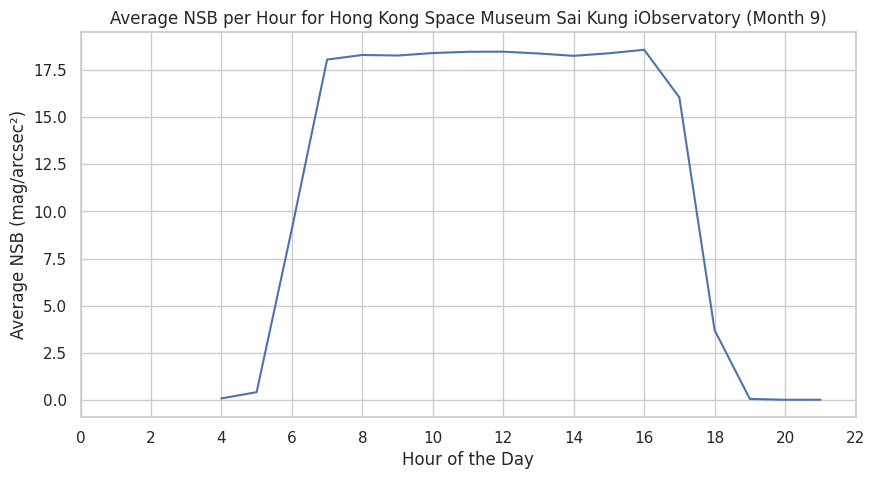

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 10 月数据...


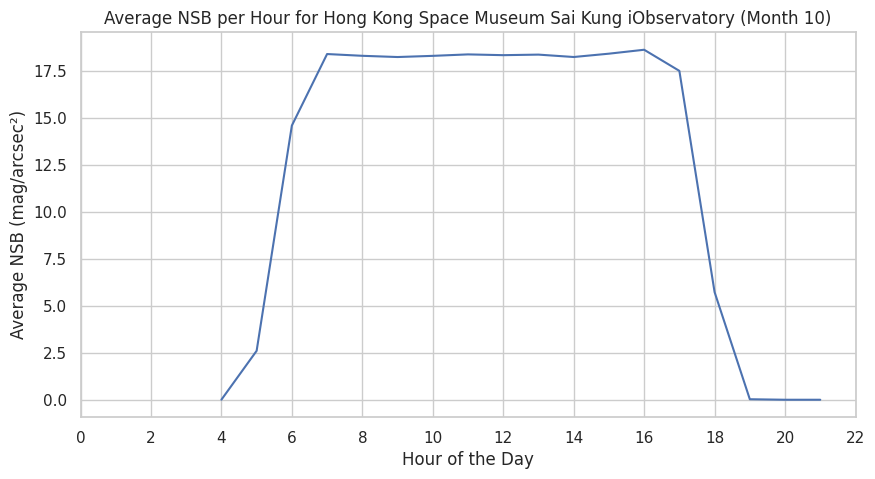

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 11 月数据...


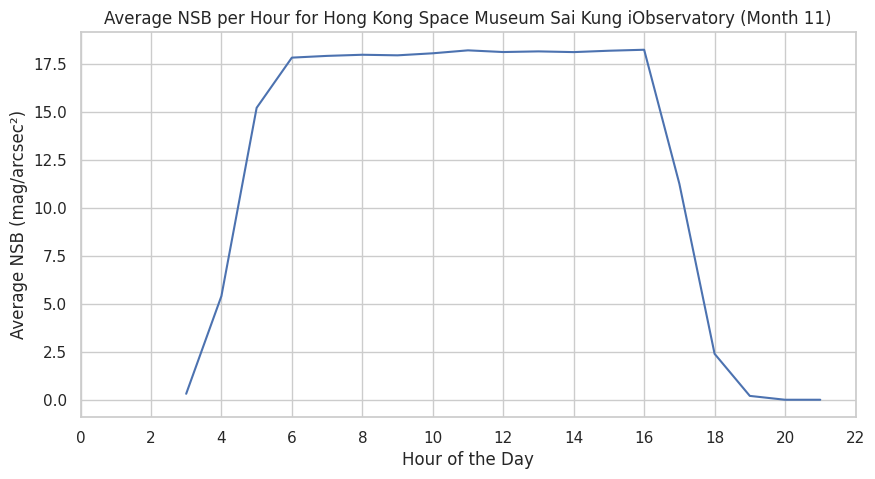

  正在分析 Hong Kong Space Museum Sai Kung iObservatory 的 12 月数据...


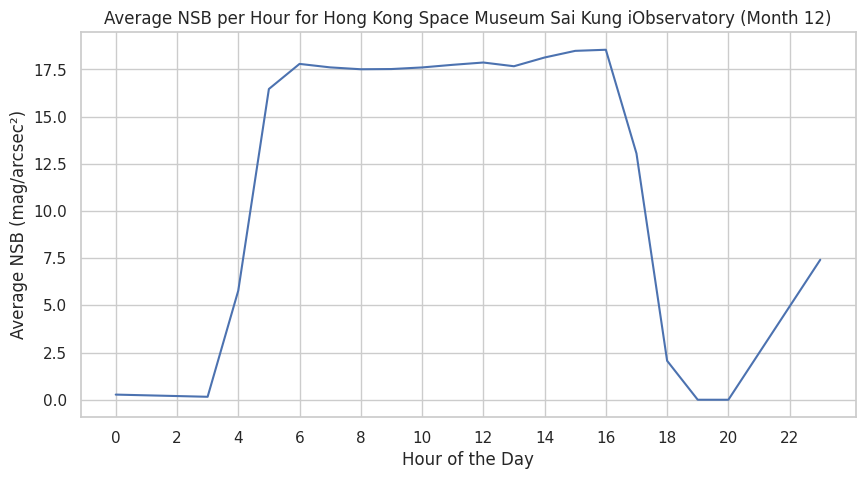

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 1 月数据...


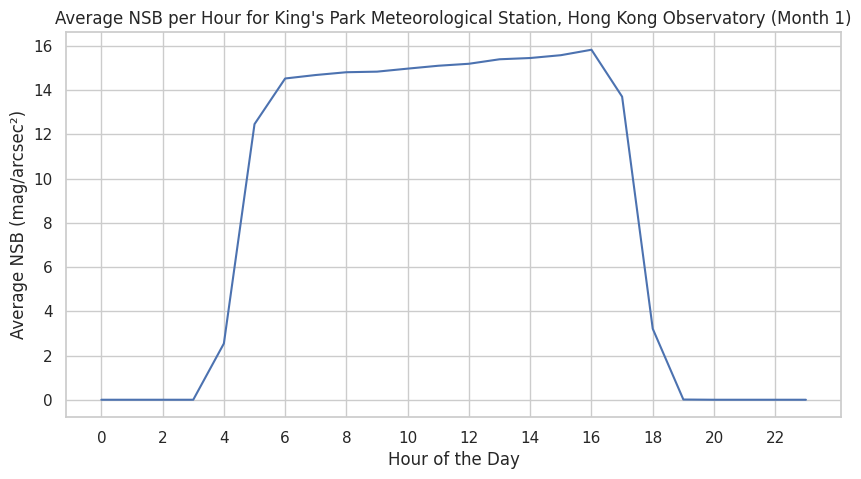

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 2 月数据...


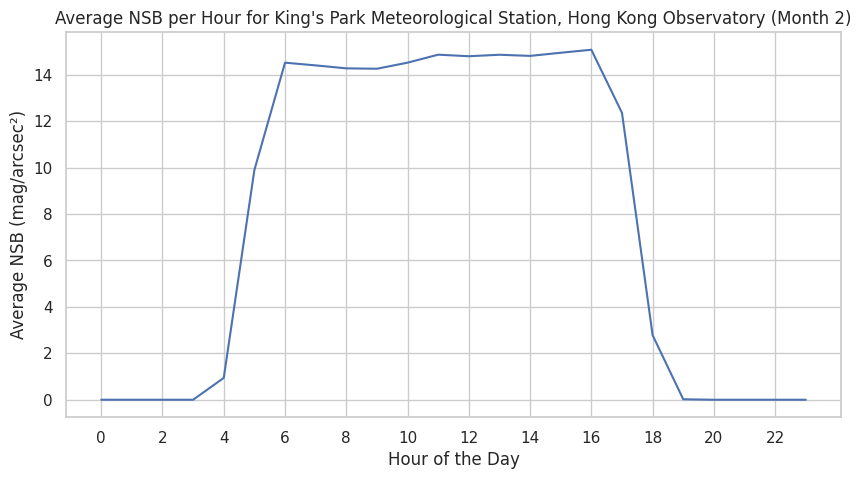

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 3 月数据...


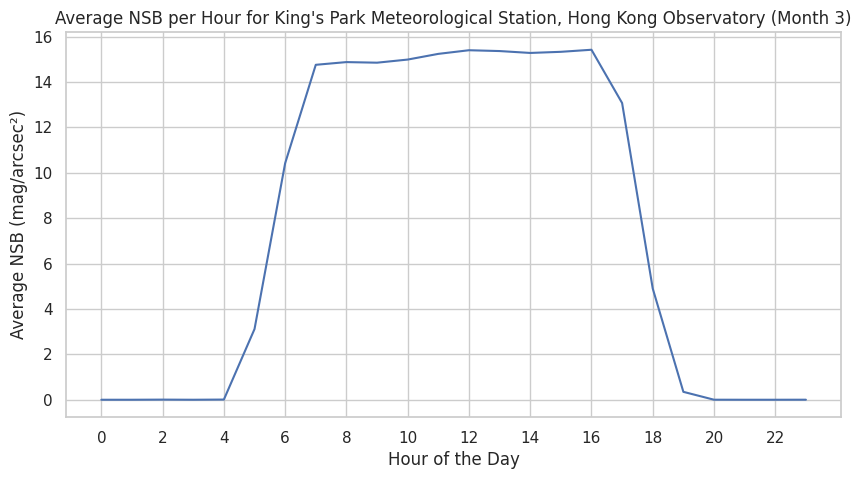

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 4 月数据...


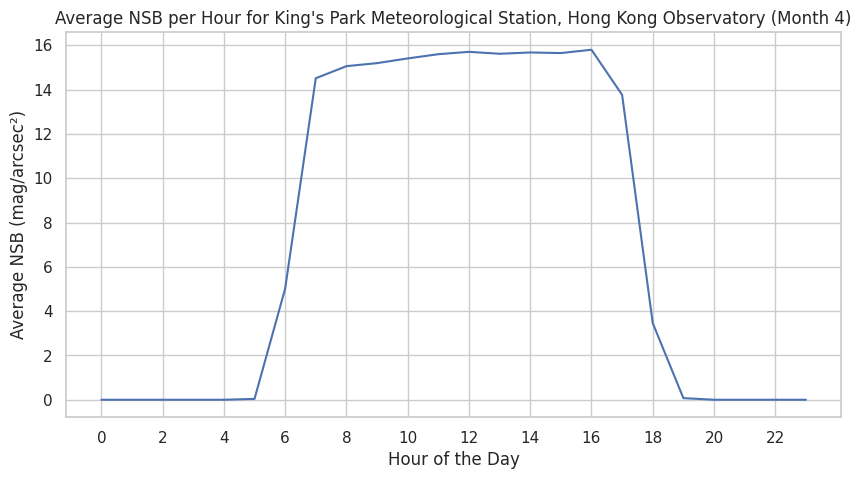

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 5 月数据...


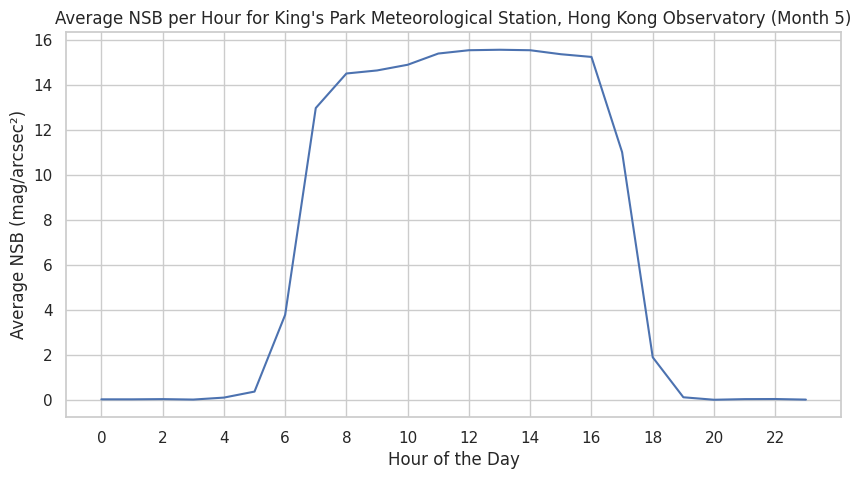

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 6 月数据...


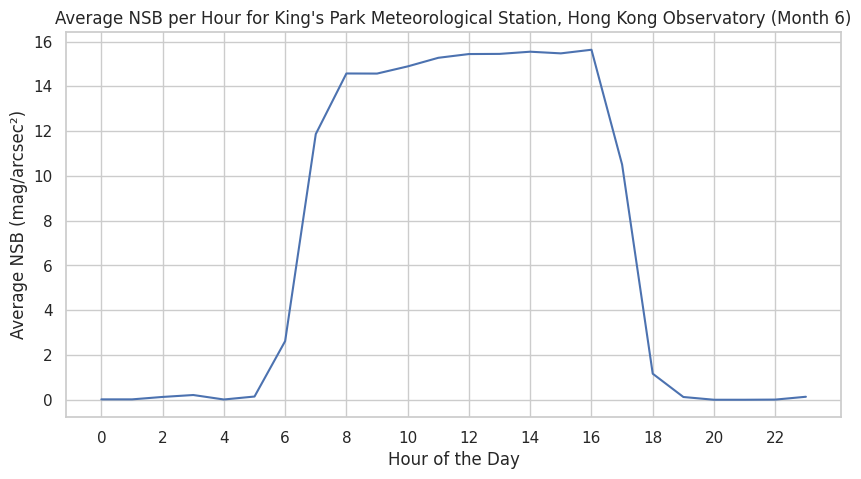

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 7 月数据...


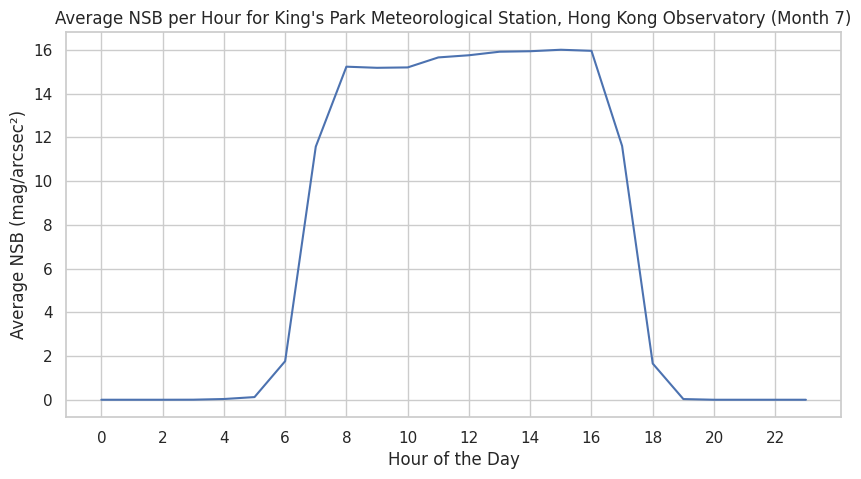

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 9 月数据...


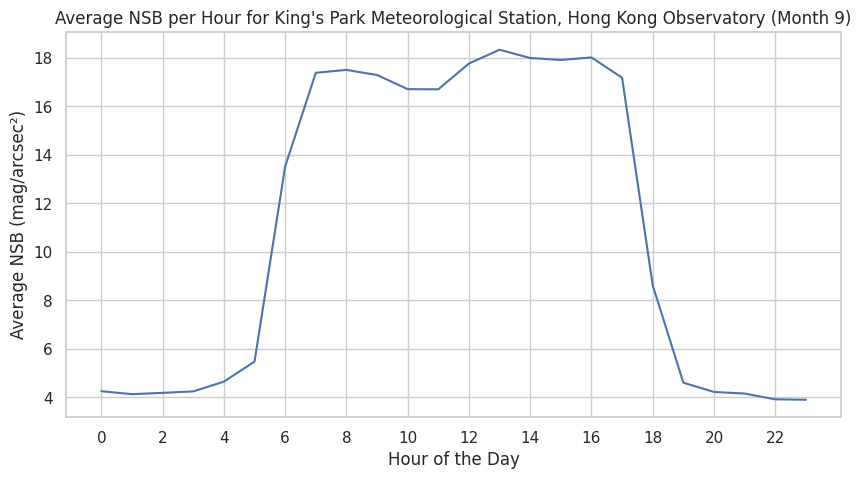

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 10 月数据...


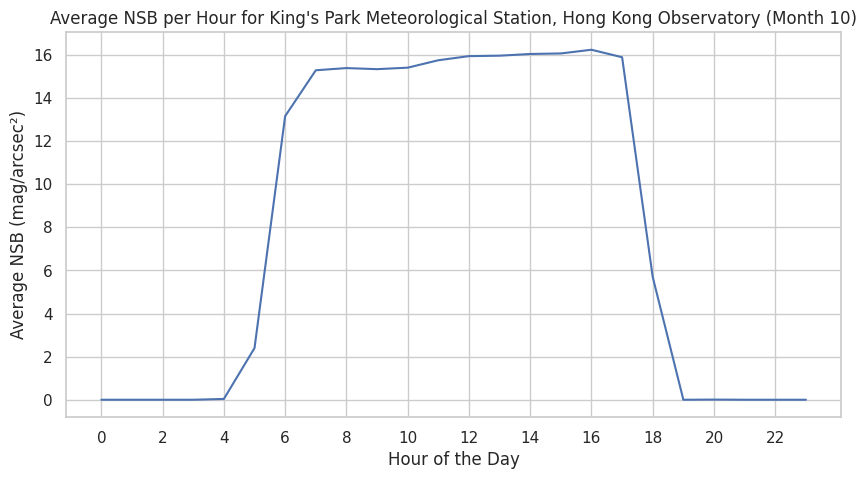

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 11 月数据...


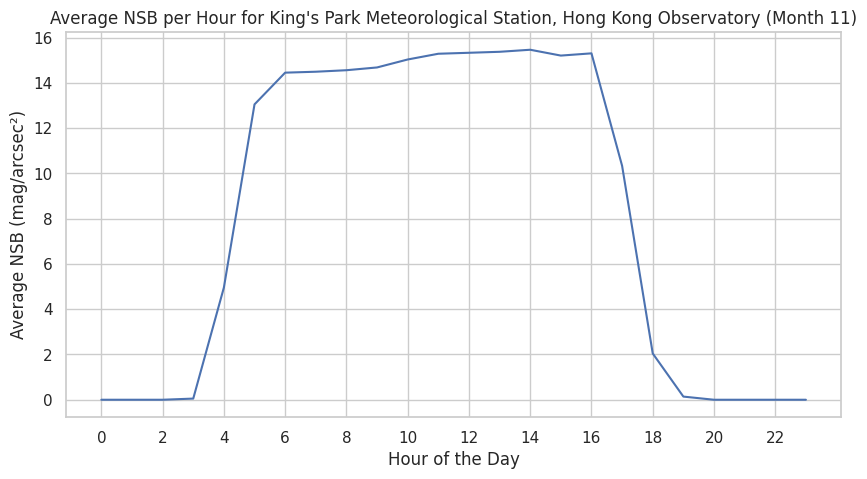

  正在分析 King's Park Meteorological Station, Hong Kong Observatory 的 12 月数据...


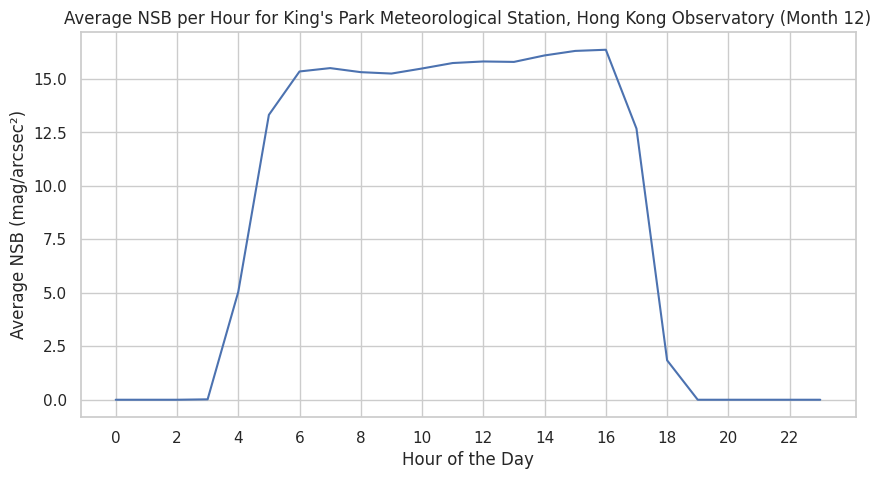

  正在分析 The University of Hong Kong 的 1 月数据...


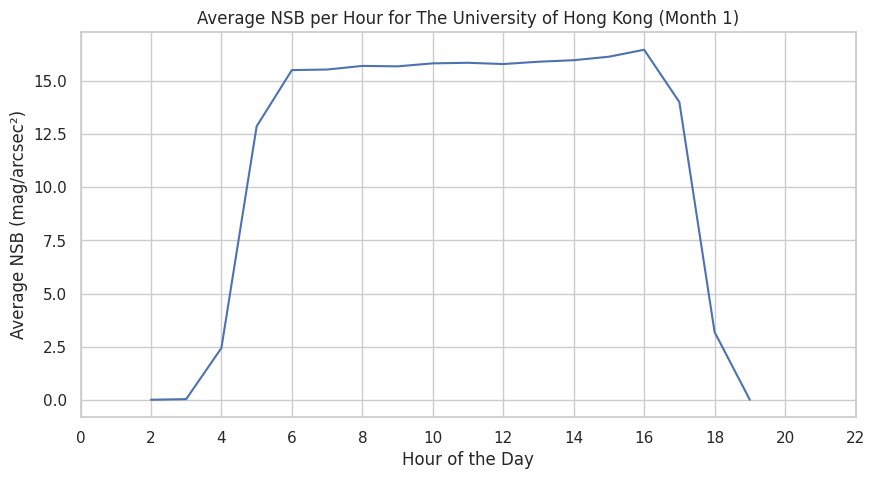

  正在分析 The University of Hong Kong 的 2 月数据...


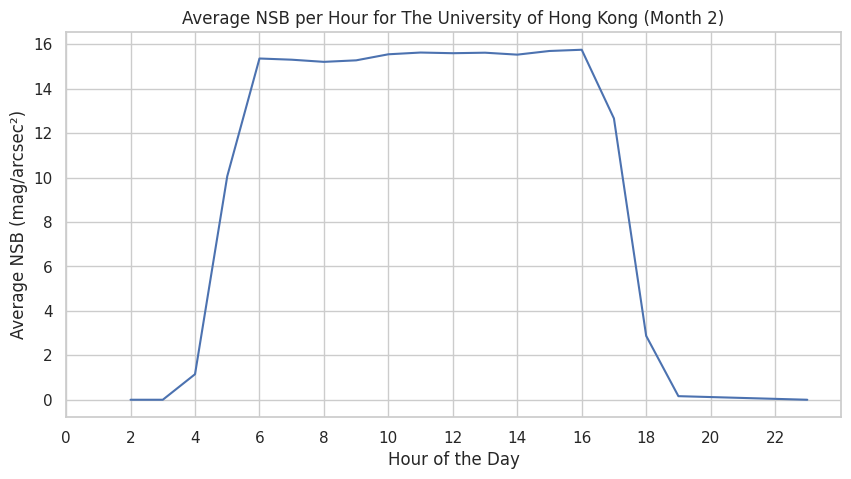

  正在分析 The University of Hong Kong 的 3 月数据...


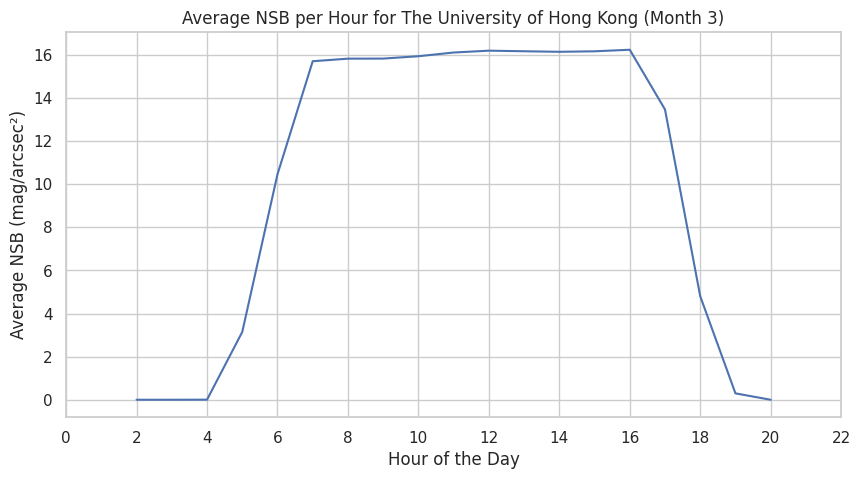

  正在分析 The University of Hong Kong 的 4 月数据...


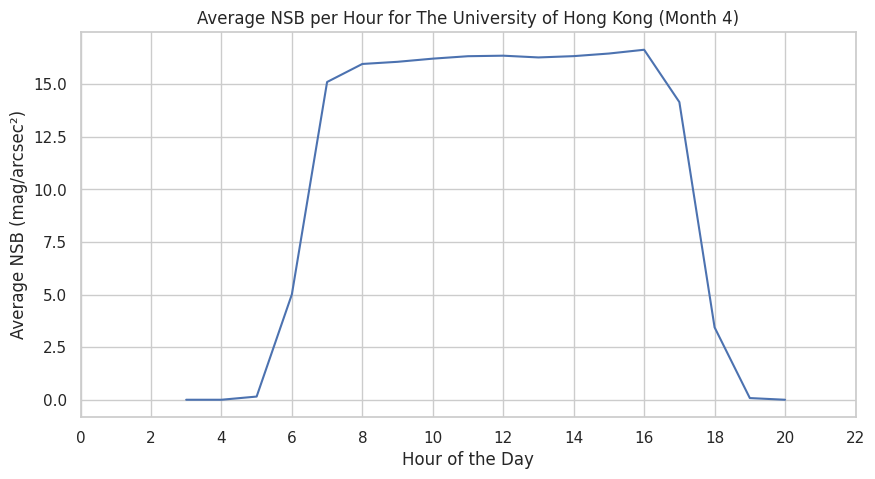

  正在分析 The University of Hong Kong 的 5 月数据...


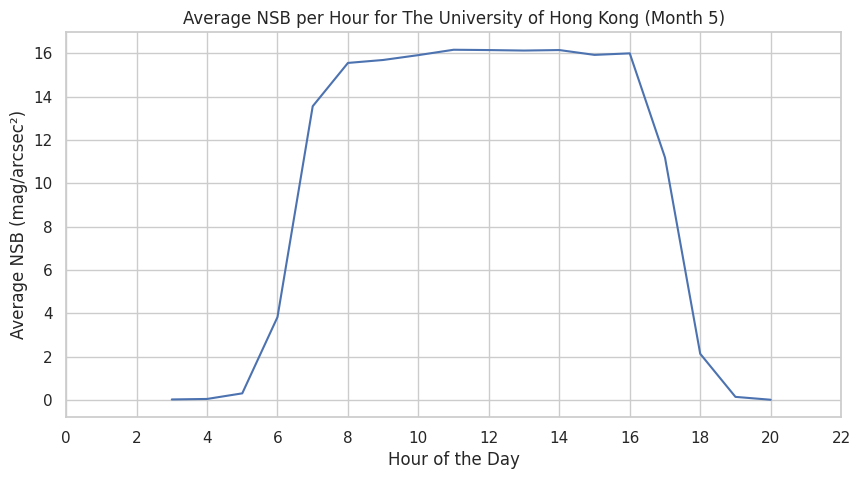

  正在分析 The University of Hong Kong 的 6 月数据...


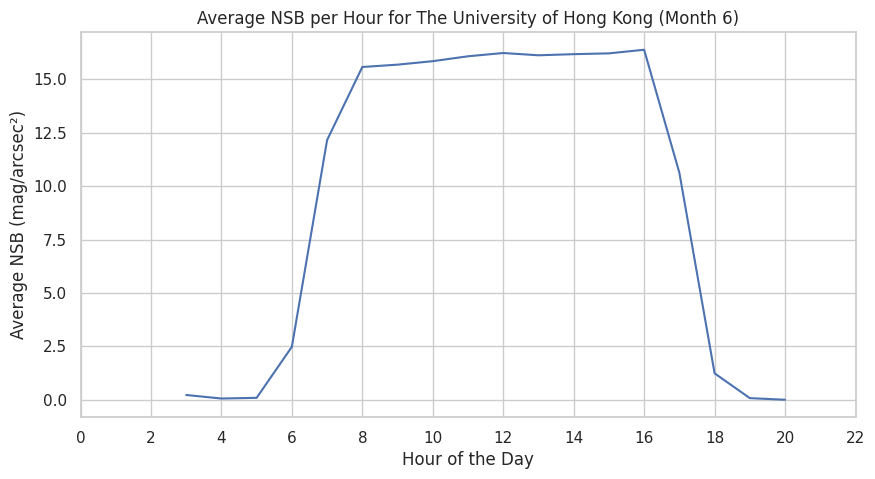

  正在分析 The University of Hong Kong 的 7 月数据...


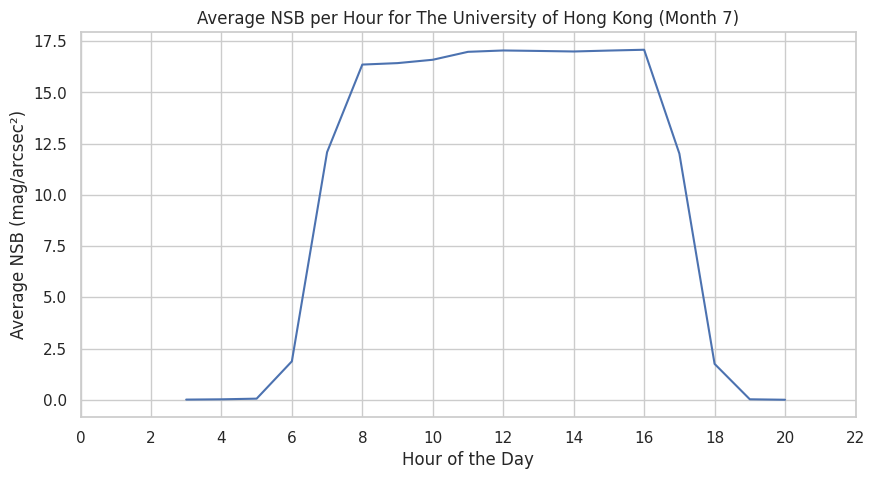

  正在分析 The University of Hong Kong 的 8 月数据...


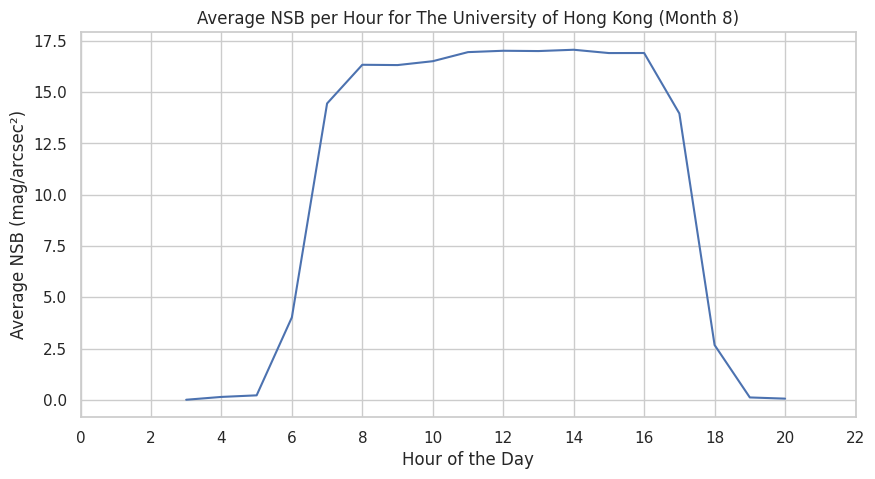

  正在分析 The University of Hong Kong 的 9 月数据...


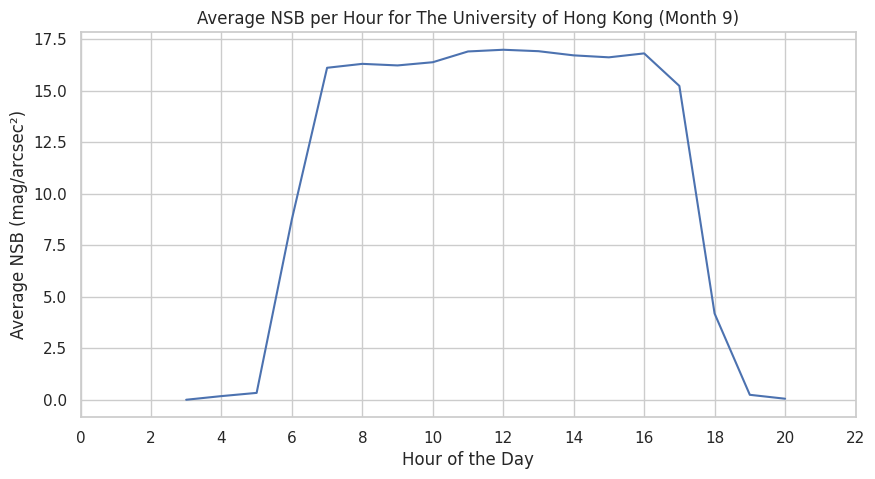

  正在分析 The University of Hong Kong 的 10 月数据...


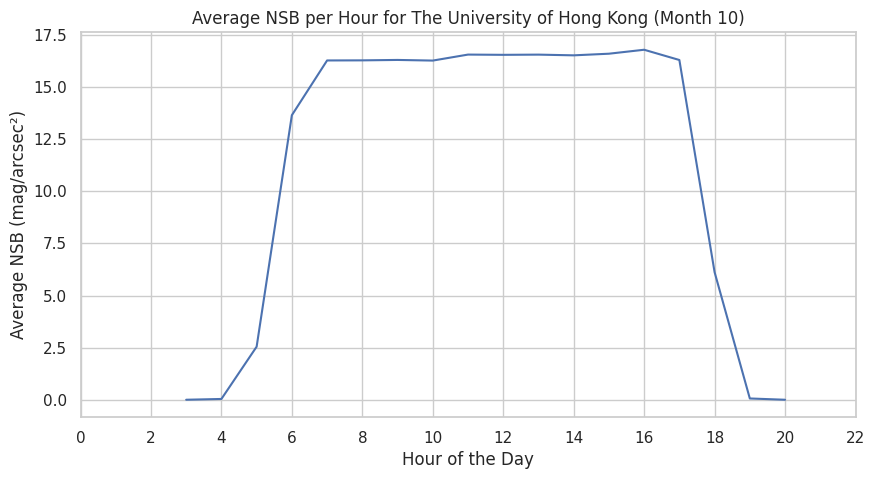

  正在分析 The University of Hong Kong 的 11 月数据...


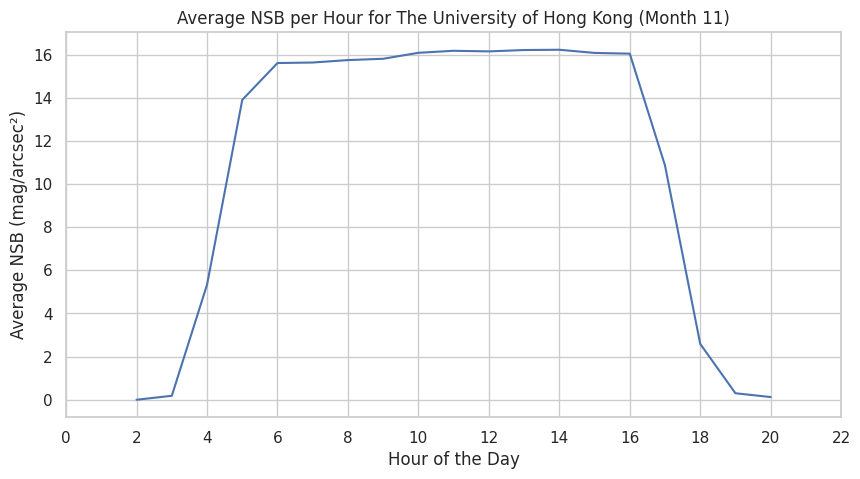

  正在分析 The University of Hong Kong 的 12 月数据...


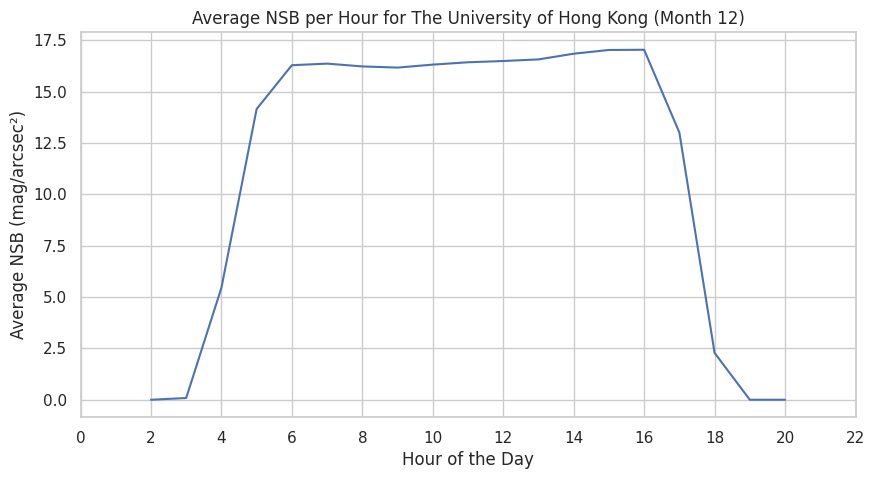

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 1 月数据...


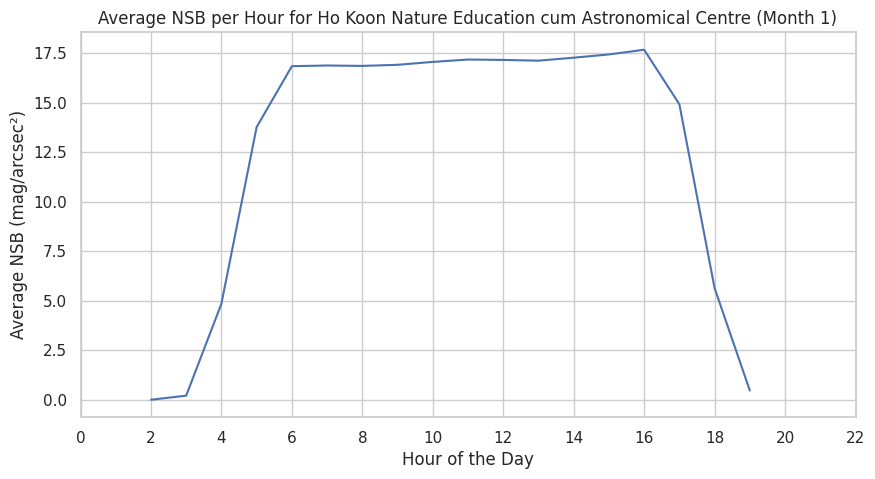

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 2 月数据...


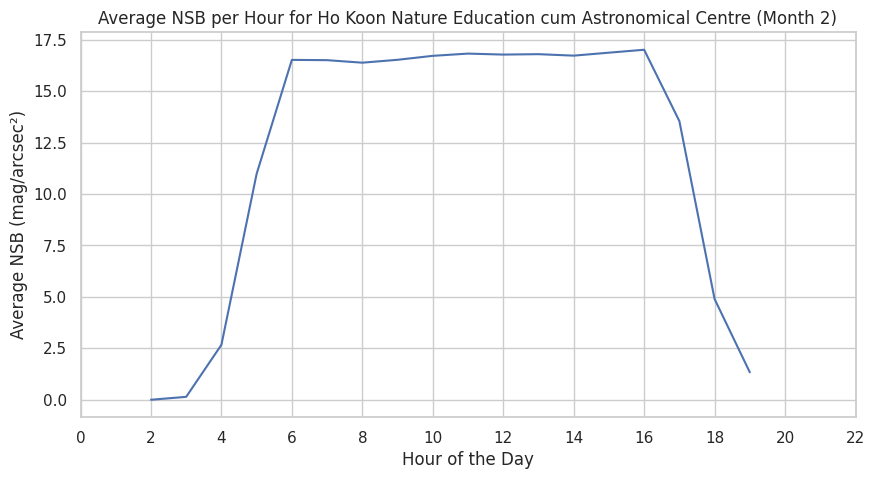

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 3 月数据...


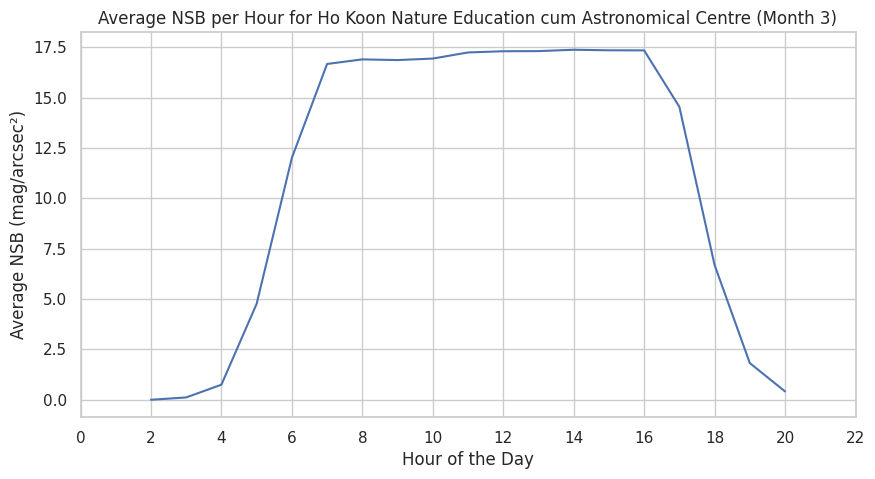

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 4 月数据...


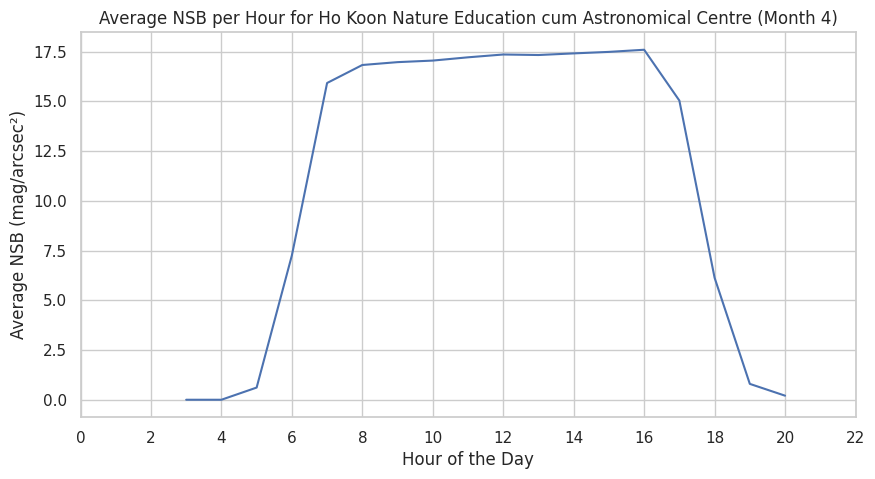

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 5 月数据...


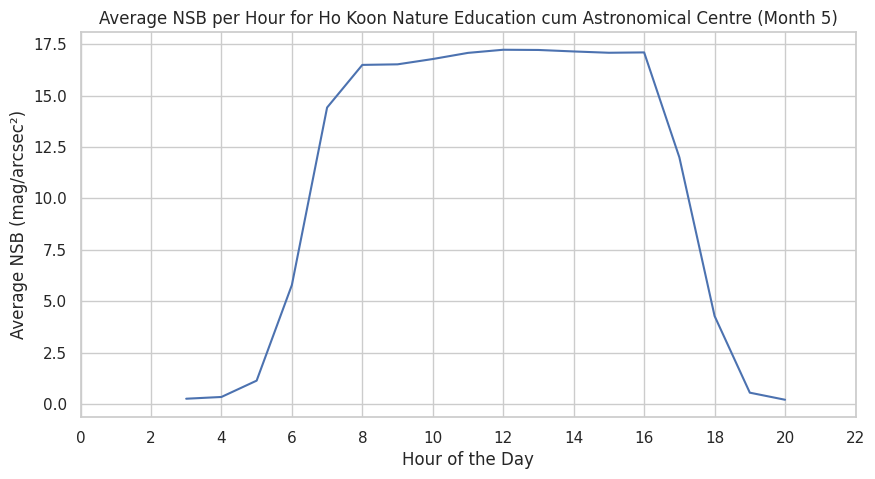

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 6 月数据...


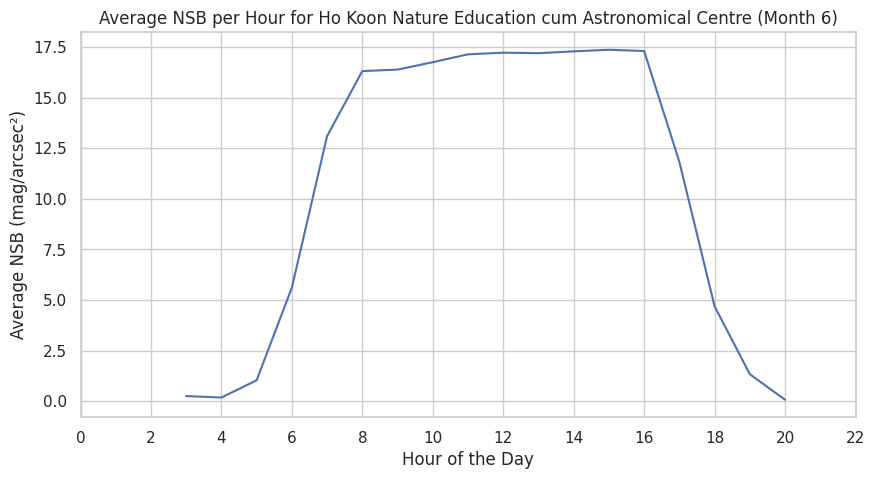

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 7 月数据...


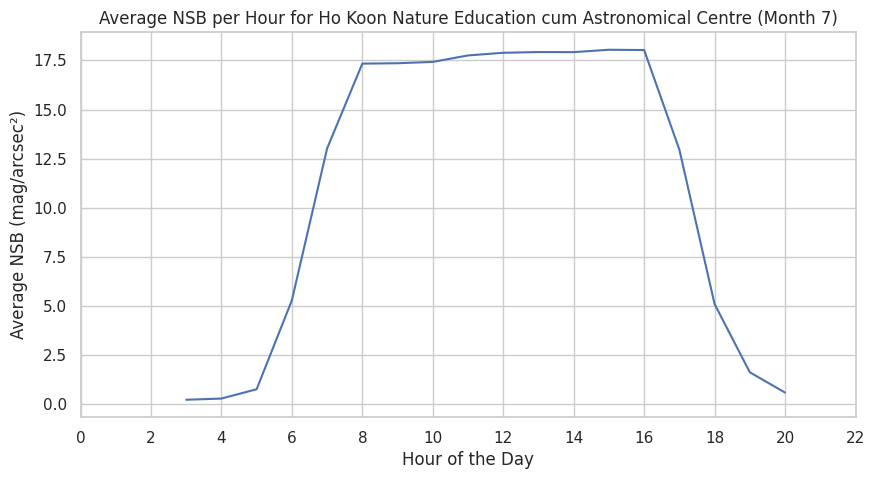

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 8 月数据...


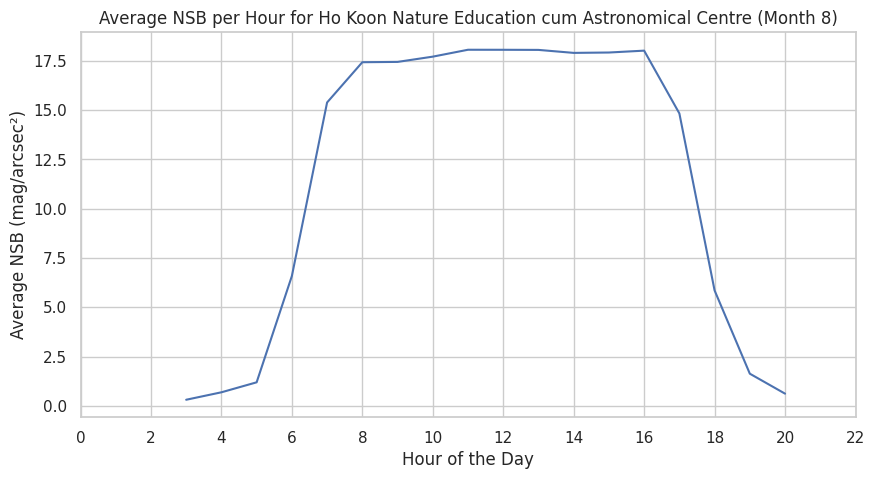

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 9 月数据...


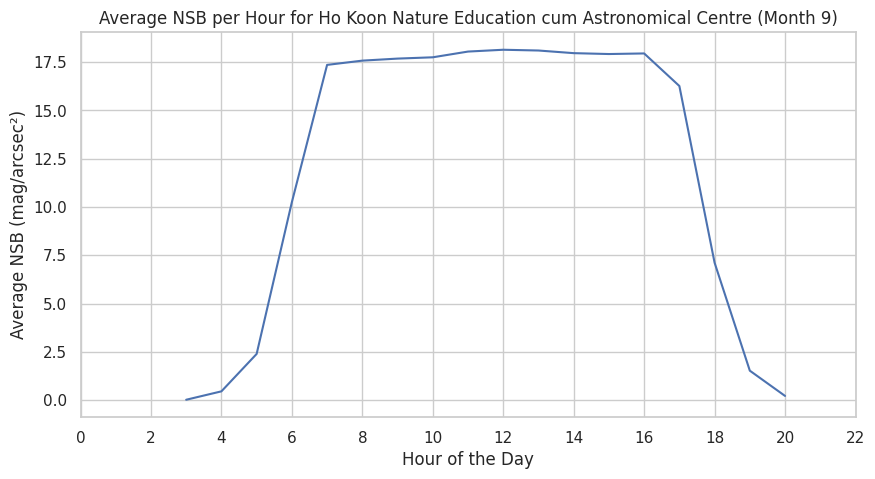

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 10 月数据...


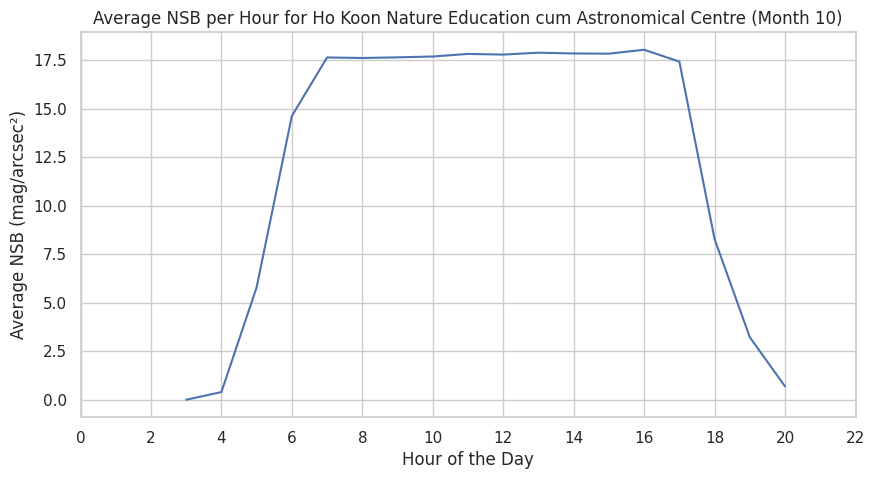

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 11 月数据...


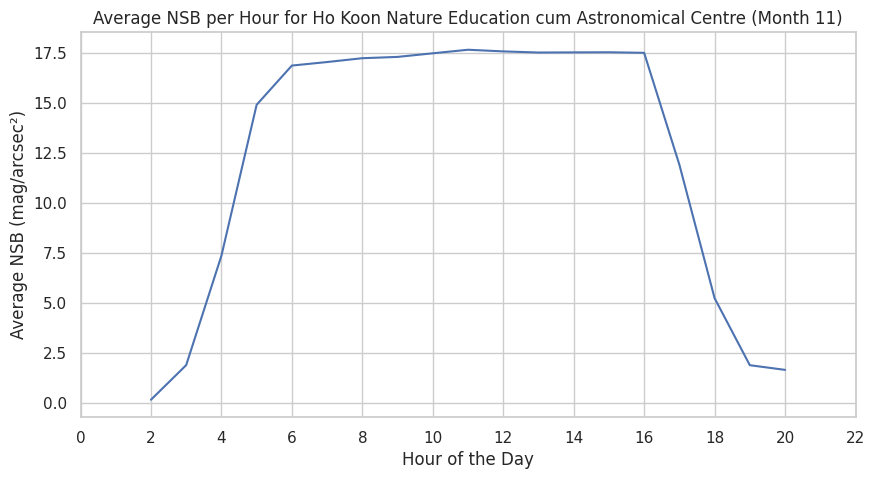

  正在分析 Ho Koon Nature Education cum Astronomical Centre 的 12 月数据...


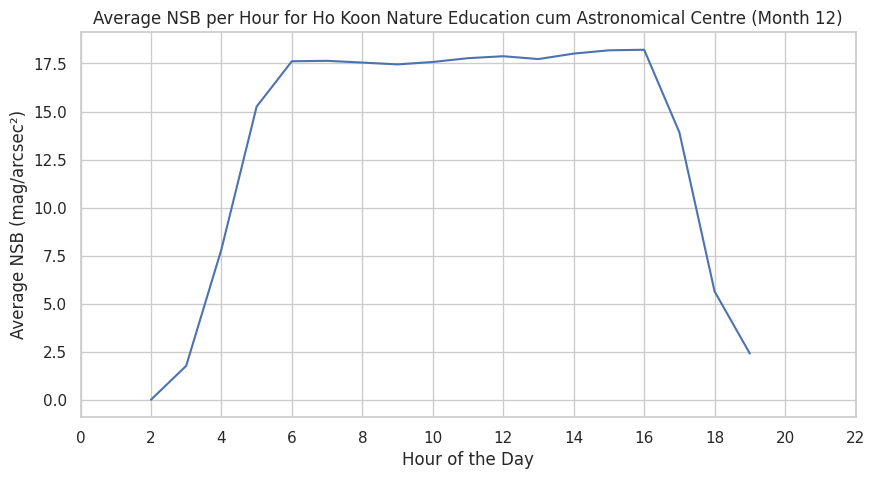

  正在分析 Mai Po Nature Reserve 的 1 月数据...


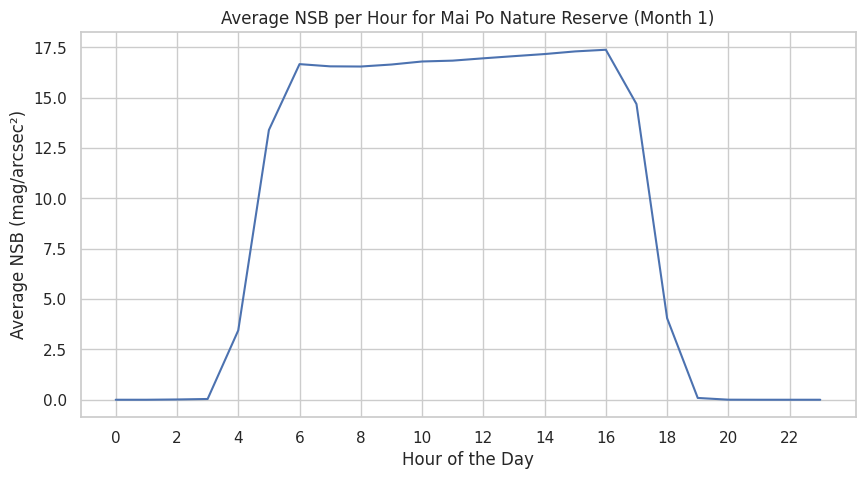

  正在分析 Mai Po Nature Reserve 的 2 月数据...


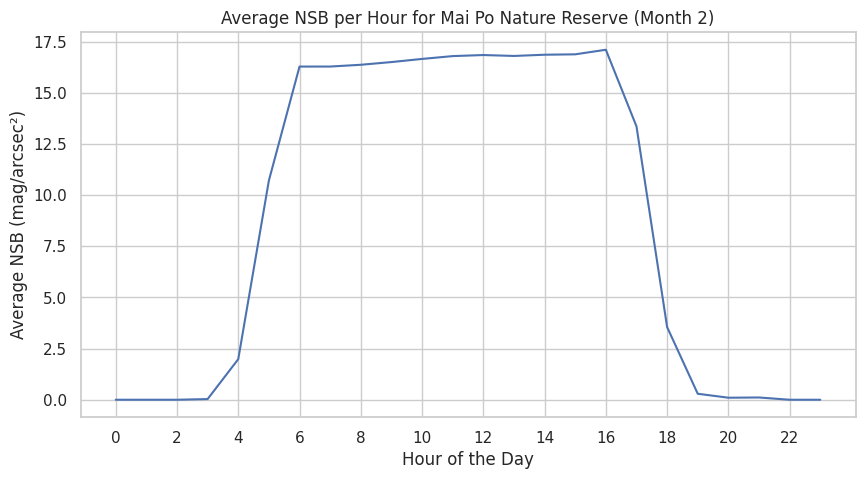

  正在分析 Mai Po Nature Reserve 的 3 月数据...


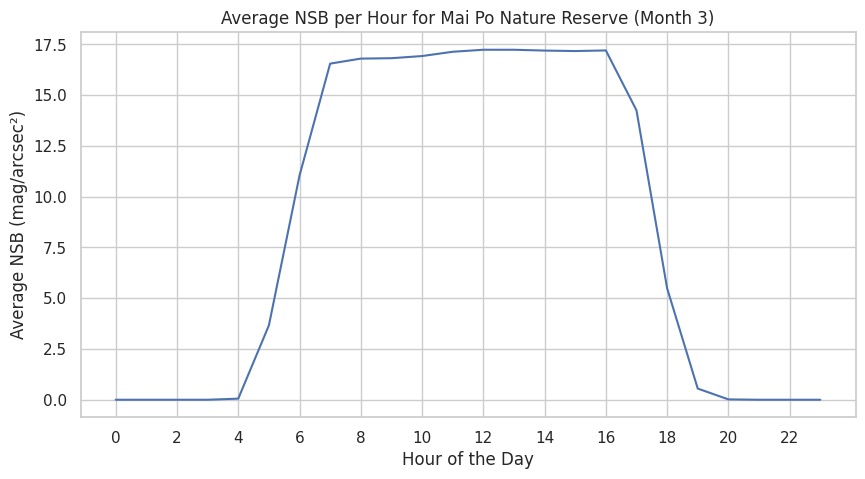

  正在分析 Mai Po Nature Reserve 的 4 月数据...


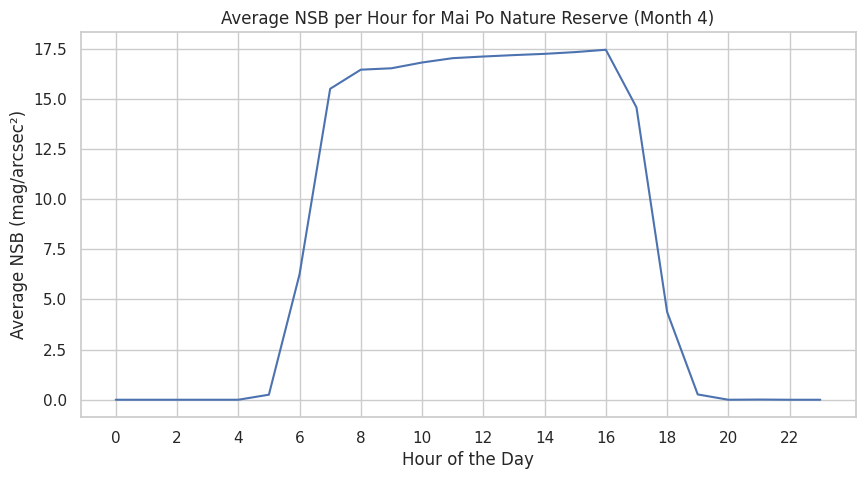

  正在分析 Mai Po Nature Reserve 的 5 月数据...


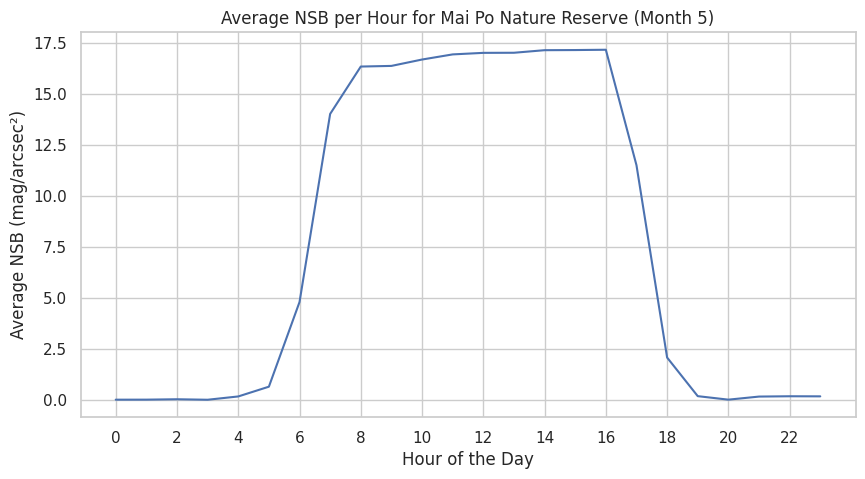

  正在分析 Mai Po Nature Reserve 的 6 月数据...


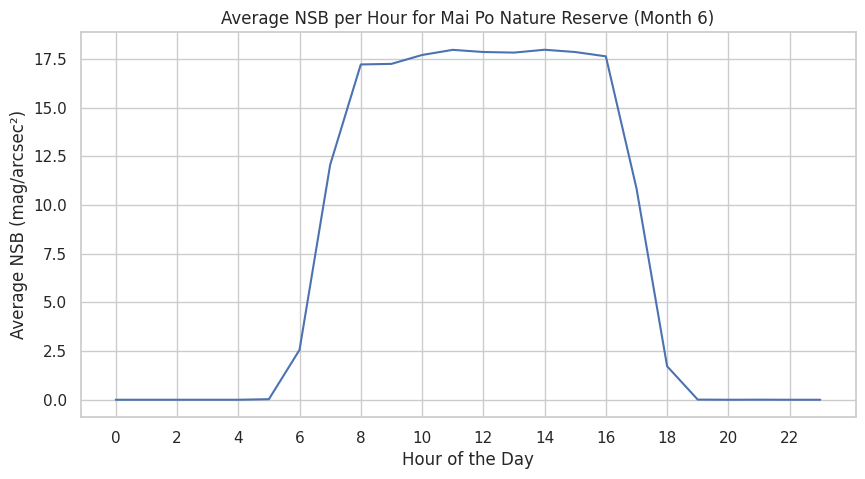

  正在分析 Mai Po Nature Reserve 的 7 月数据...


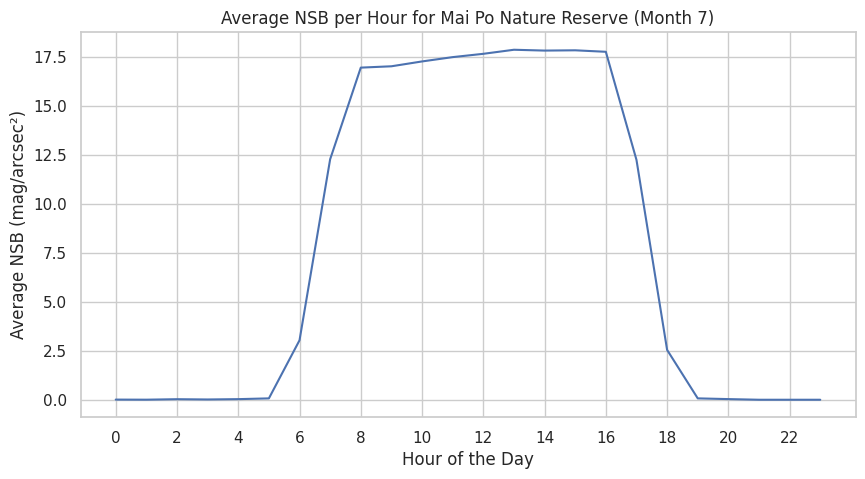

  正在分析 Mai Po Nature Reserve 的 8 月数据...


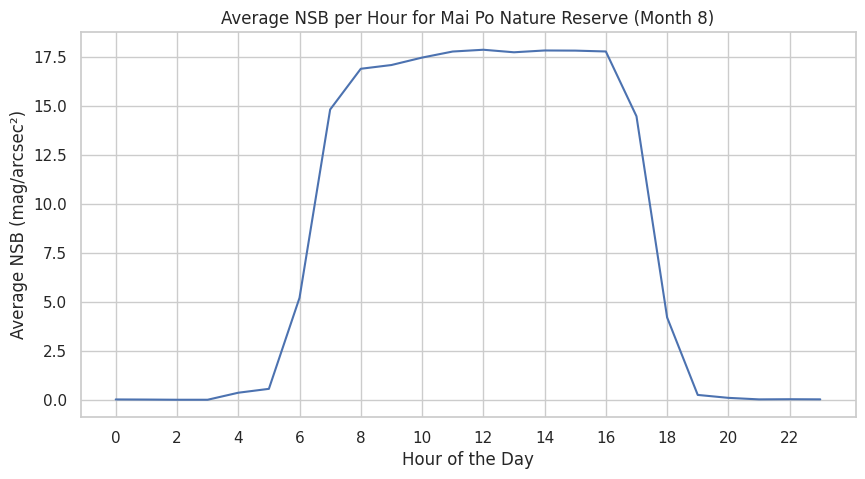

  正在分析 Mai Po Nature Reserve 的 9 月数据...


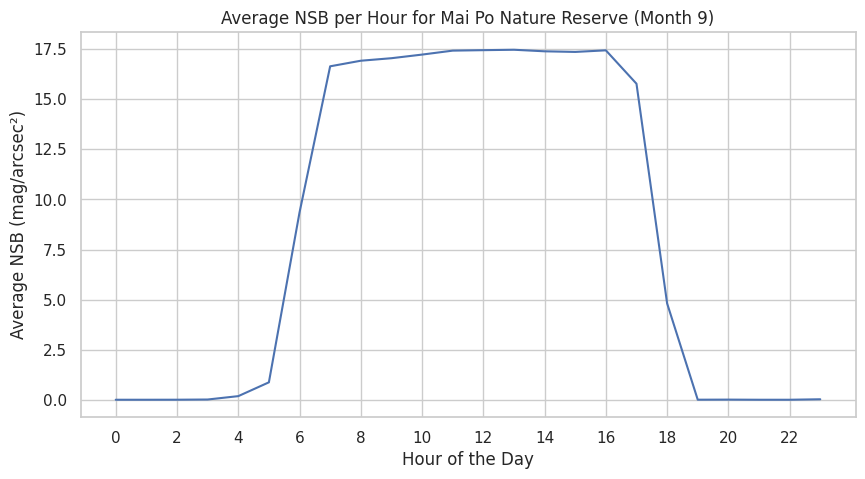

  正在分析 Mai Po Nature Reserve 的 10 月数据...


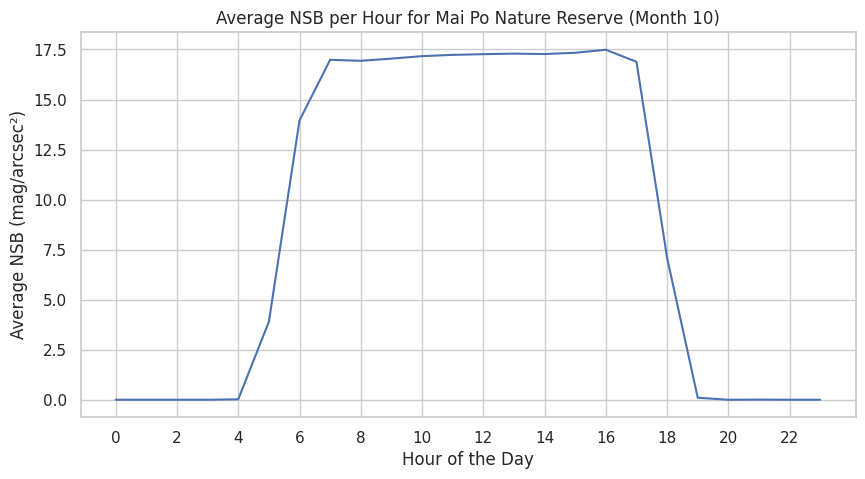

  正在分析 Mai Po Nature Reserve 的 11 月数据...


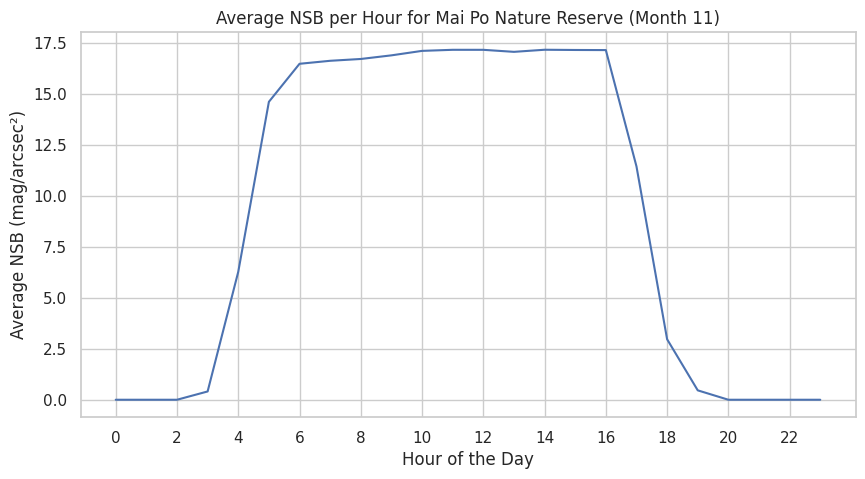

  正在分析 Mai Po Nature Reserve 的 12 月数据...


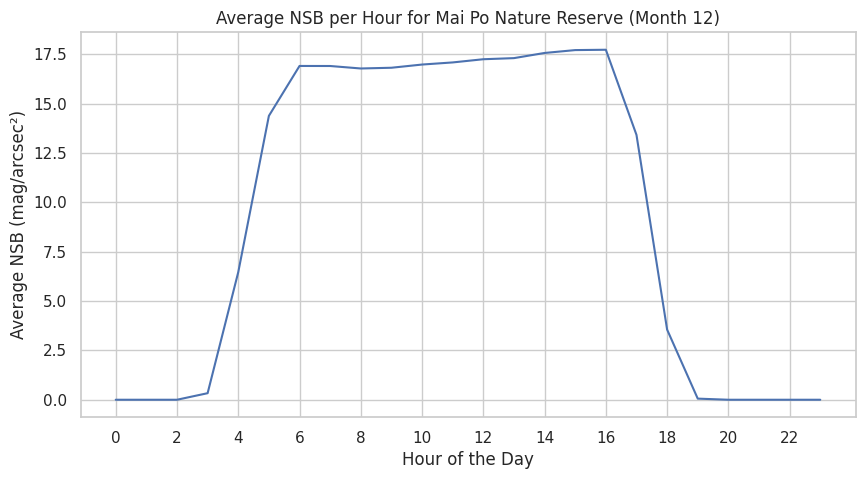

数据已保存到 /content/drive/MyDrive/hourly_avg_nsb_by_location_and_month.csv


In [ ]:
# 8. Analyze data by location
locations = all_data_with_location['location'].unique()

# Create an empty DataFrame to store hourly average NSB for all locations and months
all_hourly_avg_nsb = pd.DataFrame()

# Iterate over each location
for location in locations:
    # Filter data for the current location
    location_data = all_data_with_location[all_data_with_location['location'] == location]

    # Check if the data is empty
    if location_data.empty:
        print(f"Warning: Data for {location} is empty. Skipping this location.")
        continue

    # Check if 'hour' column exists
    if 'hour' not in location_data.columns:
        raise ValueError(f"The 'hour' column is missing in data for {location}!")

    # Check if there are any missing values in 'hour' column
    if location_data['hour'].isnull().any():
        print(f"Warning: Missing values found in 'hour' column for {location}. Dropping missing values.")
        location_data = location_data.dropna(subset=['hour'])

    # Group data by month
    monthly_grouped = location_data.groupby('month')

    # Iterate over each month
    for month, group in monthly_grouped:
        print(f"  Analyzing data for {location}, Month {month}...")

        # Calculate average NSB per hour
        hourly_avg_nsb = group.groupby('hour')['nsb'].mean()

        # Plot line chart
        plt.figure(figsize=(10, 5))
        sns.lineplot(x=hourly_avg_nsb.index, y=hourly_avg_nsb.values)
        plt.title(f'Average NSB per Hour for {location} (Month {month})')
        plt.xlabel('Hour of the Day')
        plt.ylabel('Average NSB (mag/arcsec²)')
        plt.xticks(range(0, 24, 2))  # Show ticks every two hours

        # Display plot
        plt.show()


# **New code: Save aggregated data to CSV file**
output_csv_path = "/content/drive/MyDrive/hourly_avg_nsb_by_location_and_month.csv"
all_hourly_avg_nsb.to_csv(output_csv_path, index=False, encoding='utf-8')
print(f"Data has been saved to {output_csv_path}")

In [ ]:
# Check light pollution data
print("\nLight pollution data preview:")
print(all_data.head())

# Path to the mapping file
mapping_file_path = "/content/drive/MyDrive/map_rel.csv"

# Load the mapping data
mapping_data = pd.read_csv(mapping_file_path)

# Preview the mapping table
print("\nMapping table preview:")
print(mapping_data.head())


光污染数据：
          id             created         received_utc    received_adjusted  \
0  120496144 2021-12-31 19:00:08  2022-01-01 00:00:00  2022-01-01 08:00:00   
1  120496145 2021-12-31 19:00:08  2022-01-01 00:00:02  2022-01-01 09:00:02   
2  120496146 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
3  120496147 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
4  120496148 2021-12-31 19:00:08  2022-01-01 00:00:05  2022-01-01 01:00:05   

   sqmle_serial_number    nsb  sensor_frequency  sensor_period_count  \
0                 4887   0.00          530698.0                  0.0   
1                 3575   0.00          567051.0                  0.0   
2                 5414  14.98              98.0               4687.0   
3                 5347  15.26              74.0               6154.0   
4                 2924  21.33               1.0            1843899.0   

   sensor_period_second  temperature device_code  
0                 0.000         29.6   

In [ ]:
# 4. Merge light pollution data with the mapping table
# Use the mapping table to associate device_code with location
all_data = pd.merge(all_data, mapping_data, on='device_code', how='left')

# Inspect the merged data with location information
print("\nLight pollution data after adding location:")
print(all_data.head())

# 5. Merge light pollution data with location (latitude and longitude) data
merged_data = pd.merge(all_data, location_data, on='location', how='inner')

# Check if the merged data is empty
if merged_data.empty:
    raise ValueError("The merged data is empty. Please check if 'location' values match between datasets.")

# Preview the final merged dataset
print("\nPreview of merged data:")
print(merged_data.head())

# 6. Calculate average NSB for each observation site based on latitude and longitude
average_nsb = (
    merged_data.groupby(['latitude', 'longitude'])['nsb']
    .mean()
    .reset_index()
    .rename(columns={'nsb': 'average_nsb'})
)

# Inspect the average NSB data
print("\nPreview of average NSB data:")
print(average_nsb.head())


添加 location 后的光污染数据：
          id             created         received_utc    received_adjusted  \
0  120496144 2021-12-31 19:00:08  2022-01-01 00:00:00  2022-01-01 08:00:00   
1  120496145 2021-12-31 19:00:08  2022-01-01 00:00:02  2022-01-01 09:00:02   
2  120496146 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
3  120496147 2021-12-31 19:00:08  2022-01-01 00:00:04  2021-12-31 19:00:04   
4  120496148 2021-12-31 19:00:08  2022-01-01 00:00:05  2022-01-01 01:00:05   

   sqmle_serial_number    nsb  sensor_frequency  sensor_period_count  \
0                 4887   0.00          530698.0                  0.0   
1                 3575   0.00          567051.0                  0.0   
2                 5414  14.98              98.0               4687.0   
3                 5347  15.26              74.0               6154.0   
4                 2924  21.33               1.0            1843899.0   

   sensor_period_second  temperature device_code  \
0                 0.000 

4. 空间分析：热力图

In [ ]:
# 7. Generate a heatmap visualization

# Create a map object centered around Hong Kong
m = folium.Map(location=[22.3964, 114.1095], zoom_start=10)

# Prepare data for the heatmap
heatmap_data = [[row['latitude'], row['longitude'], row['average_nsb']] for _, row in average_nsb.iterrows()]

# Add heatmap layer to the map
HeatMap(heatmap_data).add_to(m)

# Display the map
m

In [ ]:
# 7. Data Standardization (for clustering)
features = average_nsb[['latitude', 'longitude', 'average_nsb']]
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# 8. Apply K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=42)
average_nsb['kmeans_cluster'] = kmeans.fit_predict(scaled_features)

print("\nK-Means Clustering Results:")
print(average_nsb[['latitude', 'longitude', 'average_nsb', 'kmeans_cluster']].head())

# 9. Apply DBSCAN Clustering
dbscan = DBSCAN(eps=0.5, min_samples=3)  # eps and min_samples can be tuned as needed
average_nsb['dbscan_cluster'] = dbscan.fit_predict(scaled_features)

print("\nDBSCAN Clustering Results:")
print(average_nsb[['latitude', 'longitude', 'average_nsb', 'dbscan_cluster']].head())

# 10. Generate Heatmap Visualization
# Create a map object centered around Hong Kong
m = folium.Map(location=[22.3964, 114.1095], zoom_start=10)

# Prepare data for the heatmap
heatmap_data = [[row['latitude'], row['longitude'], row['average_nsb']] for _, row in average_nsb.iterrows()]

# Add heatmap layer to the map
HeatMap(heatmap_data).add_to(m)

# Save the map as an HTML file
m.save("light_pollution_heatmap.html")
print("Heatmap has been saved as light_pollution_heatmap.html")


K-Means 聚类结果：
    latitude   longitude  average_nsb  kmeans_cluster
0  22.209956  114.257899     9.115353               4
1  22.232602  113.899496     8.946539               2
2  22.283168  114.136720    11.047182               0
3  22.294445  114.171915    12.428654               0
4  22.311744  114.172859     7.846612               4

DBSCAN 聚类结果：
    latitude   longitude  average_nsb  dbscan_cluster
0  22.209956  114.257899     9.115353              -1
1  22.232602  113.899496     8.946539              -1
2  22.283168  114.136720    11.047182              -1
3  22.294445  114.171915    12.428654              -1
4  22.311744  114.172859     7.846612              -1
热力图已保存为 light_pollution_heatmap.html


5.空间分析：K-Means 聚类和DBSCAN 聚类

In [ ]:
import matplotlib.colors as mcolors

# Function to convert RGB color values to hexadecimal strings
def rgb_to_hex(rgb):
    return "#{:02x}{:02x}{:02x}".format(int(rgb[0] * 255), int(rgb[1] * 255), int(rgb[2] * 255))

# Create a map for K-Means clustering visualization
m_kmeans = folium.Map(location=[22.3964, 114.1095], zoom_start=10)

for _, row in average_nsb.iterrows():
    cluster_color = plt.cm.tab10(row['kmeans_cluster'] / 10.)  # Get color based on cluster index
    hex_color = rgb_to_hex(cluster_color)  # Convert to hex color code
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=hex_color,
        fill=True,
        fill_color=hex_color,
        popup=f"Latitude: {row['latitude']}<br>Longitude: {row['longitude']}<br>Cluster: {row['kmeans_cluster']}"
    ).add_to(m_kmeans)

# Save the K-Means clustering map as an HTML file
m_kmeans.save("kmeans_clusters.html")
print("K-Means clustering map has been saved as kmeans_clusters.html")

# 12. Create a map for DBSCAN clustering visualization
m_dbscan = folium.Map(location=[22.3964, 114.1095], zoom_start=10)

for _, row in average_nsb.iterrows():
    # Use different colors to distinguish noise and clusters
    if row['dbscan_cluster'] == -1:
        cluster_color = "gray"  # Noise points are shown in gray
    else:
        cluster_color = rgb_to_hex(plt.cm.tab10(row['dbscan_cluster'] / 10.))  # Clusters in color

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=cluster_color,
        fill=True,
        fill_color=cluster_color,
        popup=f"Latitude: {row['latitude']}<br>Longitude: {row['longitude']}<br>Cluster: {row['dbscan_cluster']}"
    ).add_to(m_dbscan)

# Save the DBSCAN clustering map as an HTML file
m_dbscan.save("dbscan_clusters.html")
print("DBSCAN clustering map has been saved as dbscan_clusters.html")

K-Means clustering

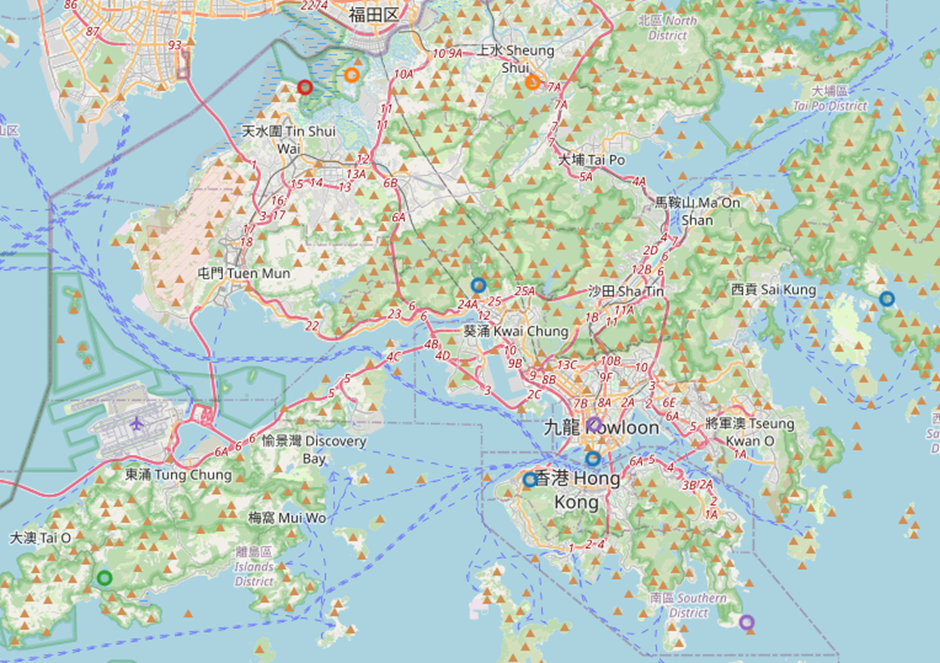

DBSCAN clustering
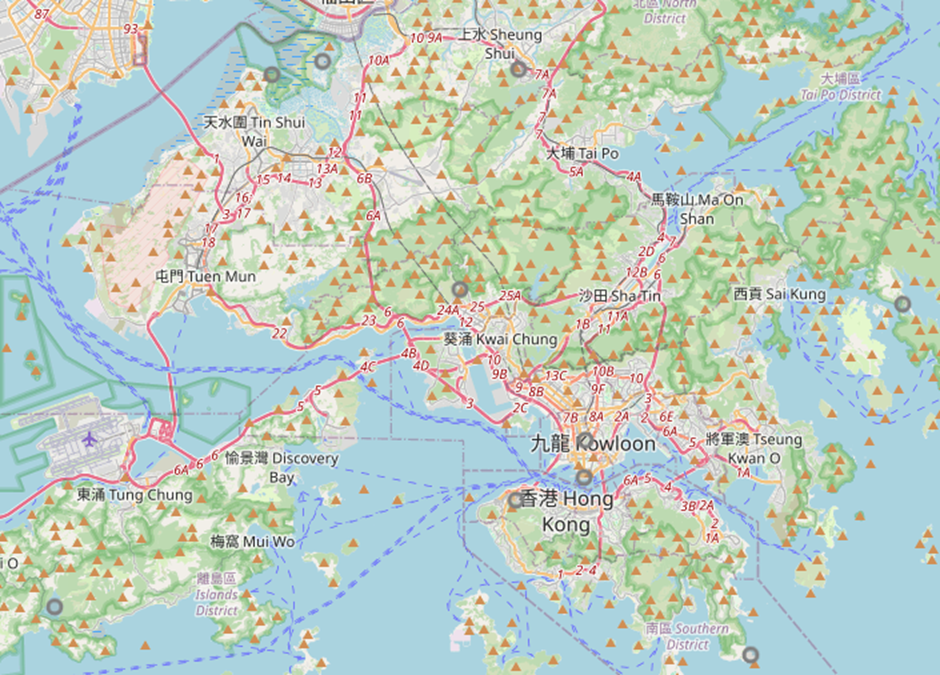

In [ ]:
!pip install pykrige

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 979.6/979.6 kB 19.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest
from pykrige.ok import OrdinaryKriging
import folium
from folium.plugins import HeatMap
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

6. 检测异常值

方法一： Z-Score

方法二：孤立森林


--- 异常检测 ---


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


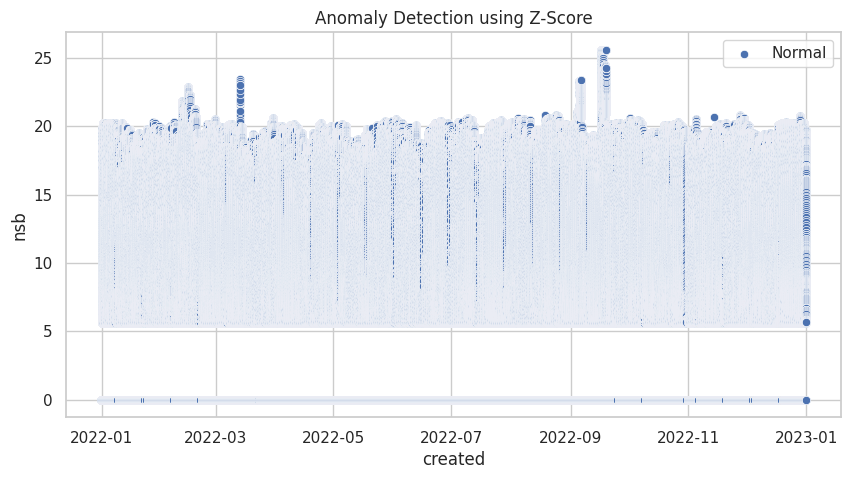

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


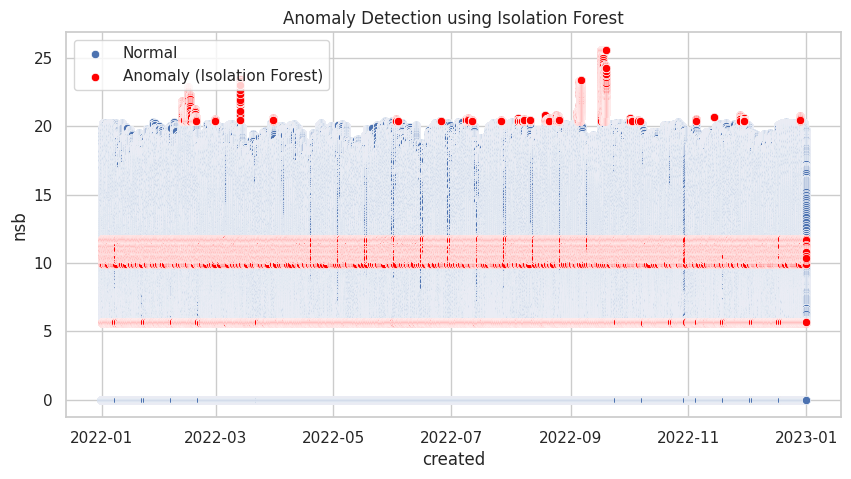

In [ ]:
# Anomaly Detection
print("\n--- Anomaly Detection ---")

# Method 1: Detect outliers using Z-Score
from scipy.stats import zscore

all_data_with_location['z_score'] = zscore(all_data_with_location['nsb'])
threshold = 3  # Set threshold for anomaly detection
anomalies_zscore = all_data_with_location[abs(all_data_with_location['z_score']) > threshold]

# Visualize anomalies detected by Z-Score
plt.figure(figsize=(10, 5))
sns.scatterplot(x='created', y='nsb', data=all_data_with_location, label="Normal")
sns.scatterplot(x='created', y='nsb', data=anomalies_zscore, color='red', label="Anomaly (Z-Score)")
plt.title("Anomaly Detection using Z-Score")
plt.show()

# Method 2: Detect anomalies using Isolation Forest
features = all_data_with_location[['nsb']]
model = IsolationForest(contamination=0.01)  # Assume 1% of the data are anomalies
all_data_with_location['anomaly_if'] = model.fit_predict(features)

# Extract anomalies
anomalies_if = all_data_with_location[all_data_with_location['anomaly_if'] == -1]

# Visualize anomalies detected by Isolation Forest
plt.figure(figsize=(10, 5))
sns.scatterplot(x='created', y='nsb', data=all_data_with_location, label="Normal")
sns.scatterplot(x='created', y='nsb', data=anomalies_if, color='red', label="Anomaly (Isolation Forest)")
plt.title("Anomaly Detection using Isolation Forest")
plt.show()

7. 克里金插值法


--- 克里金插值 ---
插值结果已保存到 /content/drive/MyDrive/kriging_interpolated_nsb.csv
观测点数据已保存到 /content/drive/MyDrive/observation_points_nsb.csv


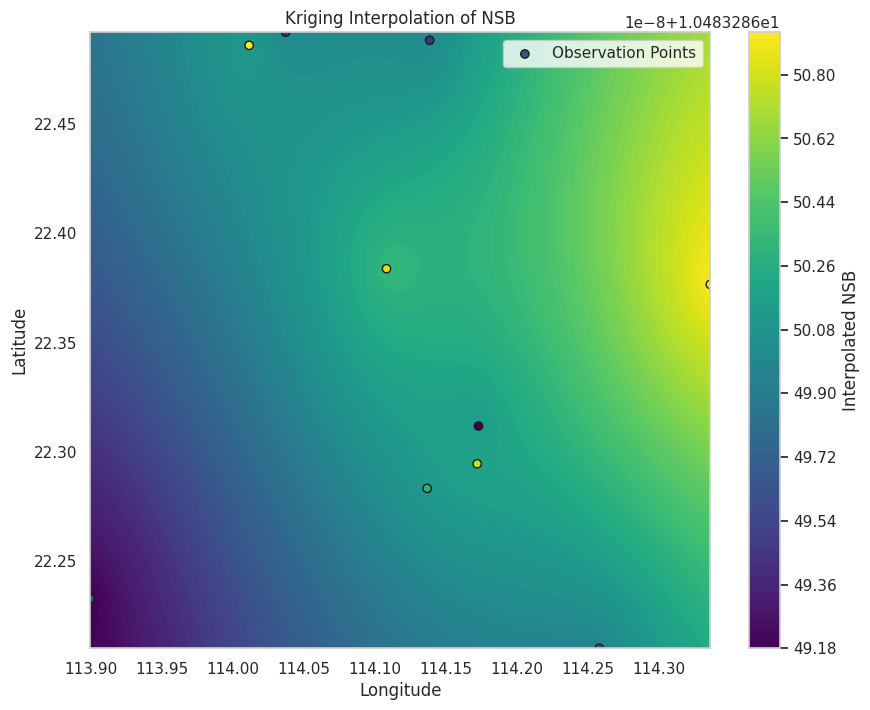

In [ ]:
#  Kriging Interpolation
print("\n--- Kriging Interpolation ---")

# Calculate average NSB per location
avg_nsb_by_location = all_data_with_location.groupby('location').agg({
    'latitude': 'first',
    'longitude': 'first',
    'nsb': 'mean'
}).reset_index()

# Prepare grid for interpolation
grid_lon = np.linspace(avg_nsb_by_location['longitude'].min(), avg_nsb_by_location['longitude'].max(), num=100)
grid_lat = np.linspace(avg_nsb_by_location['latitude'].min(), avg_nsb_by_location['latitude'].max(), num=100)

# Perform Ordinary Kriging interpolation
OK = OrdinaryKriging(
    avg_nsb_by_location['longitude'],
    avg_nsb_by_location['latitude'],
    avg_nsb_by_location['nsb'],
    variogram_model="linear"
)
z, ss = OK.execute("grid", grid_lon, grid_lat)


# **New code: Save interpolated data**
# Convert interpolated results to DataFrame
interpolated_data = pd.DataFrame({
    'longitude': np.tile(grid_lon, len(grid_lat)),  # Expand longitude grid
    'latitude': np.repeat(grid_lat, len(grid_lon)),  # Expand latitude grid
    'interpolated_nsb': z.flatten()  # Flatten the interpolated values
})

# Save interpolated data to CSV file
output_csv_path_interpolated = "/content/drive/MyDrive/kriging_interpolated_nsb.csv"
interpolated_data.to_csv(output_csv_path_interpolated, index=False, encoding='utf-8')
print(f"Interpolation results have been saved to {output_csv_path_interpolated}")

# **New code: Save observation point data**
output_csv_path_observations = "/content/drive/MyDrive/observation_points_nsb.csv"
avg_nsb_by_location.to_csv(output_csv_path_observations, index=False, encoding='utf-8')
print(f"Observation point data has been saved to {output_csv_path_observations}")

# Plot the kriging interpolation result
plt.figure(figsize=(10, 8))
plt.contourf(grid_lon, grid_lat, z, levels=100, cmap="viridis")
plt.colorbar(label="Interpolated NSB")
plt.scatter(avg_nsb_by_location['longitude'], avg_nsb_by_location['latitude'],
            c=avg_nsb_by_location['nsb'], edgecolor='k', cmap="viridis", label="Observation Points")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Kriging Interpolation of NSB")
plt.legend()
plt.show()